# Tutorial on the python implementation of MGP-DCNN

### Reference paper : 


# 0] Prerequisites
- Install
    (a) Pytorch and GPytorch
    (b) Keras and tensorflow
    (c) All other dependencies below

- Clone repo https://github.com/iurteaga/hcm

### Imports

In [1]:
import torch
import gpytorch
import h5py
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from skopt.space import Real, Integer
from scipy.signal import resample, find_peaks
import sys
import os
import pdb
# New code
sys.path.append('../../src/MGP_DCNN')
from data_processing import * # Some auxiliary functions
from MGP import * # MGP models
from TNN import * # TNN models
from RNN  import * # RNN models
from expected_distance  import * # Expected distance implementation

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d
Using TensorFlow backend.


### Visualization of data

In [2]:
hormone_labels=['LH', 'FSH', 'E2', 'P4', 'Ih']
# Number of FFT points
n_fft=512

def visualize_data(y_data):
    for i in np.arange(y_data.shape[0]):
        # Cycle_length
        Y = np.fft.fft(y_data[i,:,].T,n_fft)
        max_f_lh=np.argsort(np.abs(Y[0,:int(n_fft/2)])**2)[-1:0:-1][:15]
        y_cycle_length=np.amin(max_f_lh[(max_f_lh>20) & (max_f_lh<40)])
        # Plotting
        for h in np.arange(len(hormone_labels)):
            plt.plot(y_data[i,:,h], label=hormone_labels[h])
            plt.title('Individual number {} with cycle_length of {} days'.format(i, y_cycle_length))
        legend = plt.legend(loc='upper right', ncol=1, shadow=True)
        plt.autoscale(enable=True, axis='x', tight=True)
        plt.show()

In [50]:
def plot_y_reconstruct_and_predict(y_data, subset_of_points,
                                   y_predicted,
                                   nb_individuals_train, nb_individuals_val, nb_individuals_test):
    assert y_data.shape==y_predicted.shape
    # Plot all individuals
    for i in np.arange(y_data.shape[0]):
        # Plotting
        if i<nb_individuals_train:
            individual_type='TRAIN'
        elif i<nb_individuals_train+nb_individuals_val:
            individual_type='TRAIN validation'
        elif i>=nb_individuals_train+nb_individuals_val:
            individual_type='TEST'
        print('{} individual number {}'.format(individual_type, i))
        plt.figure()
        plt.tight_layout()
        for h in np.arange(len(hormone_labels)):
            plt.subplot(3,2,h+1)
            # Training
            plt.axvspan(0, subset_of_points[i].max(), facecolor='g', alpha=0.1)
            plt.scatter(subset_of_points[i], y_data[i,subset_of_points[i],h], marker='x', facecolor='g') # label='Training points'
            # True
            #plt.plot(y_data[i,:,h], label='True {}'.format(hormone_labels[h]))
            plt.plot(y_data[i,:,h])
            # Reconstructed
            #plt.plot(y_predicted[i,:,h], label='Reconstructed {}'.format(hormone_labels[h]))
            plt.plot(y_predicted[i,:,h])
            plt.title(hormone_labels[h])
            #legend = plt.legend(bbox_to_anchor=(1.05,0.95), loc='upper left', ncol=2, shadow=True)
            plt.xlabel('t')
            plt.autoscale(enable=True, axis='x', tight=True)
        plt.subplots_adjust(wspace=1, hspace=1)
        plt.show()

In [4]:
def plot_y_GP_reconstruct_and_predict(y_data, subset_of_points,
                                   y_mean_predicted, y_var_predicted,
                                   nb_individuals_train, nb_individuals_val, nb_individuals_test):
    # Plot all individuals
    for i in np.arange(y_data.shape[0]):
        # Plotting
        if i<nb_individuals_train:
            individual_type='TRAIN'
        elif i<nb_individuals_train+nb_individuals_val:
            individual_type='TRAIN validation'
        elif i>=nb_individuals_train+nb_individuals_val:
            individual_type='TEST'
        print('{} individual number {}'.format(individual_type, i))
        plt.figure()
        plt.tight_layout()
        for h in np.arange(len(hormone_labels)):
            plt.subplot(3,2,h+1)
            # Training
            plt.axvspan(0, subset_of_points[i].max(), facecolor='g', alpha=0.1)
            plt.scatter(subset_of_points[i], y_data[i,subset_of_points[i],h], marker='x', facecolor='g', label='Training points')
            # True
            #plt.plot(y_data[i,:,h], label='True {}'.format(hormone_labels[h]))
            plt.plot(y_data[i,:,h])
            # Reconstructed
            #plt.plot(y_predicted[i,:,h], label='Reconstructed {}'.format(hormone_labels[h]))
            plt.plot(y_mean_predicted[i,:,h])
            plt.fill_between(np.arange(y_predicted[i,:,h].size),
                             y_mean_predicted[i,:,h]-np.sqrt(y_var_predicted[i,:,h]),
                             y_mean_predicted[i,:,h]+np.sqrt(y_var_predicted[i,:,h]),
                             alpha=0.3)
            plt.title(hormone_labels[h])
            #legend = plt.legend(bbox_to_anchor=(1.05,0.95), loc='upper left', ncol=2, shadow=True)
            plt.xlabel('t')
            plt.autoscale(enable=True, axis='x', tight=True)
        plt.subplots_adjust(wspace=1, hspace=1)
        plt.show()

### Import the provided example data

In [5]:
data_file = '../../data/mlhc_2019/realistic_dataset.pickle'
with open(data_file, 'rb') as f:
    y_data=pickle.load(f)

# Shape of dataset
y_data_shape = y_data.shape
print(y_data.shape)

(60, 300, 5)


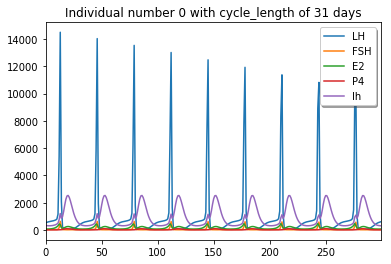

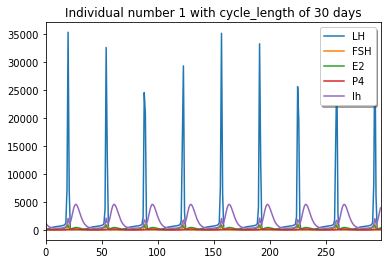

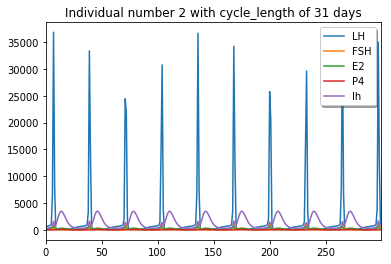

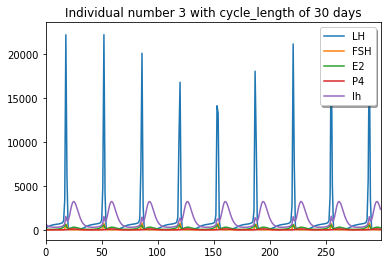

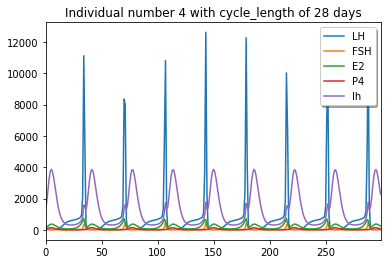

...

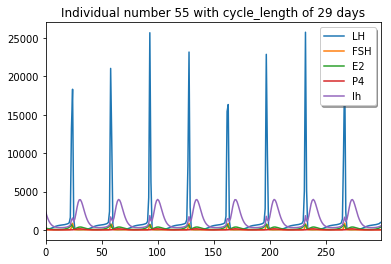

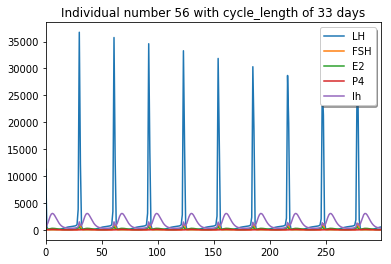

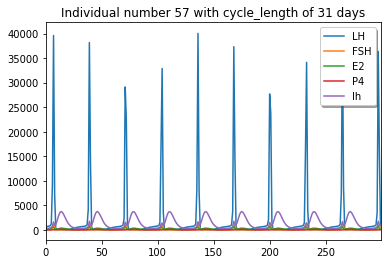

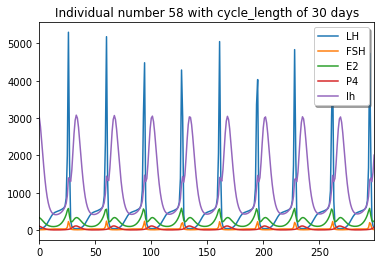

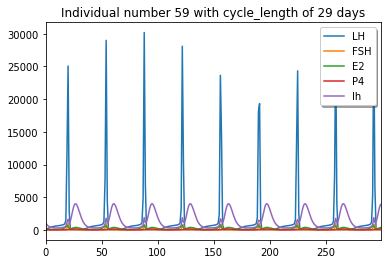

In [6]:
# Visualize original data
visualize_data(y_data)

In [7]:
# If desired, random shuffling of individuals (so that each execution is different)
permutation_index = np.random.permutation(np.arange(y_data_shape[0]))
y_data=y_data[permutation_index]

### Hyperparameters

In [8]:
################## Data related
nb_input_tasks = y_data_shape[-1]   #number of tasks selected for the input and output of the MGP = input DCNN
nb_output_tasks = y_data_shape[-1]  #number of tasks selected for the output of the DCNN

nb_individuals = 60    #number of individuals
nb_individuals_train = 40  #number of individuals for the training of the DCNN
nb_individuals_val = 10   #number of individuals for the validation of the DCNN
nb_individuals_test = 10  #number of individuals for the test of the DCNN
assert(nb_individuals_train + nb_individuals_val + nb_individuals_test == nb_individuals)

nb_time_steps = 105       # number of time steps
nb_train_time_steps = 70  # time limit for the training (limit between reconstruction and forecast)

# number of posterior samples we want to drawn from each individual MGP distribution
nb_samples_per_id = 1000

# Execution type and folder
main_dir='../../results/mlhc_2019'
if not os.path.exists(main_dir):
    os.makedirs(main_dir)
exec_type='MGP_DCNN_tutorial'
if not os.path.exists('{}/{}/trained_models'.format(main_dir,exec_type)):
    os.makedirs('{}/{}/trained_models'.format(main_dir,exec_type))

### Data preprocessing

In [9]:
# Data aligned by peaks
y_data = align_data_on_peak(y_data, length=nb_time_steps, column=0)
# Subset of data to consider
y_data = y_data[:nb_individuals, :nb_time_steps]
y_data_shape = y_data.shape

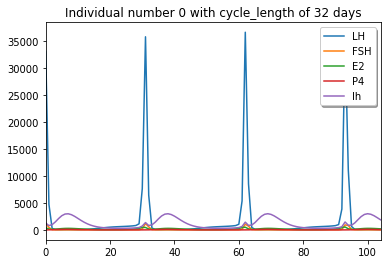

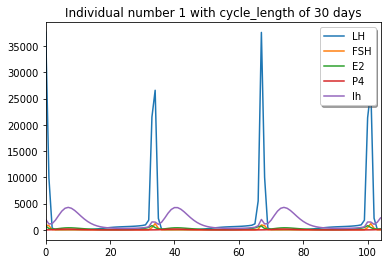

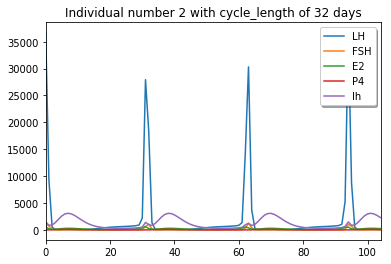

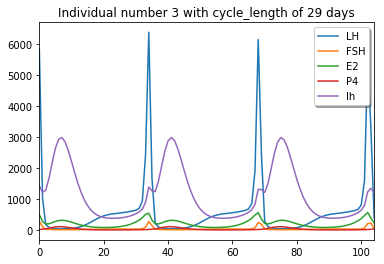

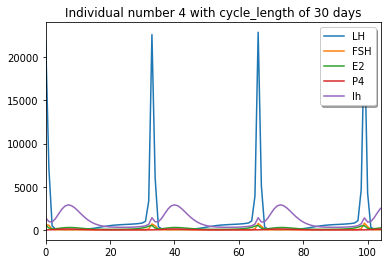

...

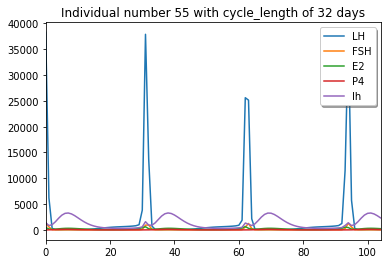

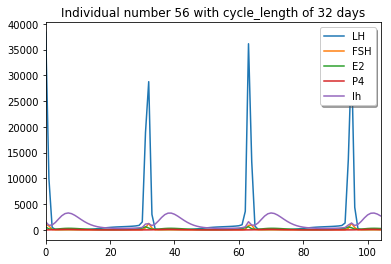

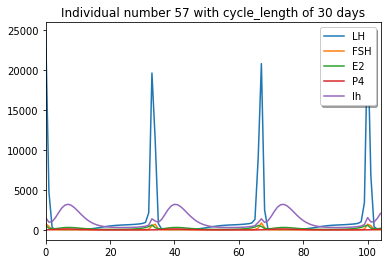

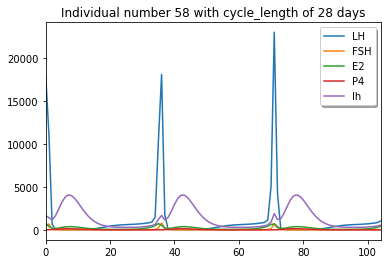

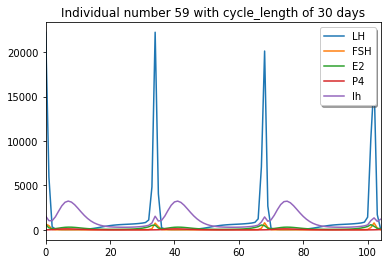

In [10]:
# Visualize data after alignment
visualize_data(y_data)

In [11]:
# Scale data per user and hormone
y_scaler=StandardScaler()
y_data_train=y_scaler.fit_transform(y_data[:nb_individuals_train].reshape(-1, y_data_shape[-1]))
print(y_data_train.mean(axis=(0,1)), y_data_train.std(axis=(0,1)))
y_data = y_scaler.transform(y_data.reshape(-1,y_data_shape[-1])).reshape(y_data_shape)
print(y_data.mean(axis=(0,1)), y_data.std(axis=(0,1)))


-3.461358184202774e-16 0.9999999999999998
[ 0.0132666   0.0148792  -0.02191791 -0.00706063 -0.00849254] [1.03859236 1.03765412 0.98305359 0.98780191 0.98692691]


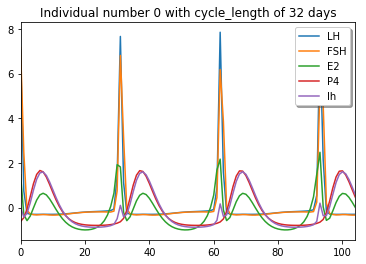

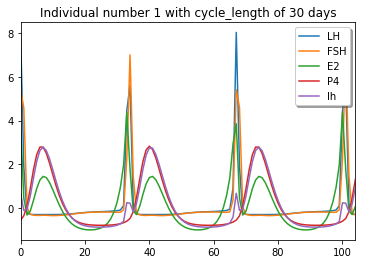

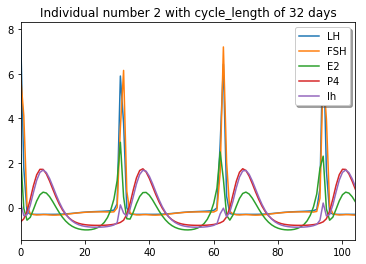

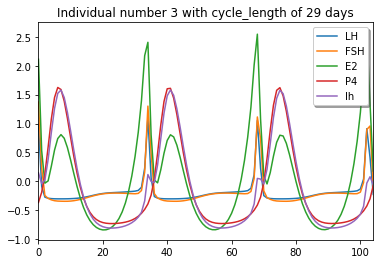

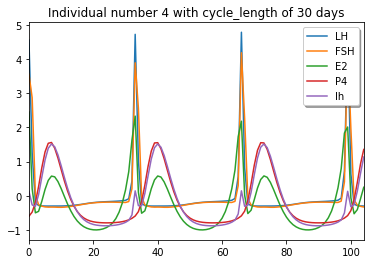

...

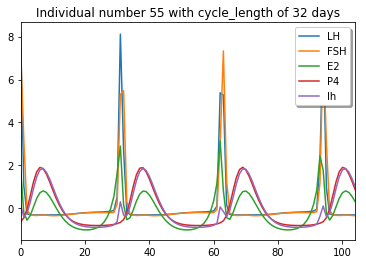

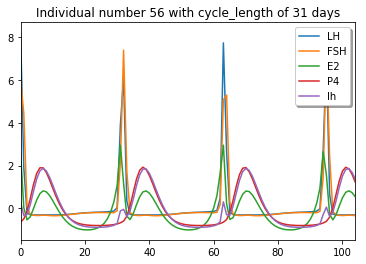

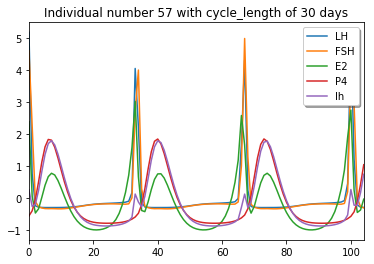

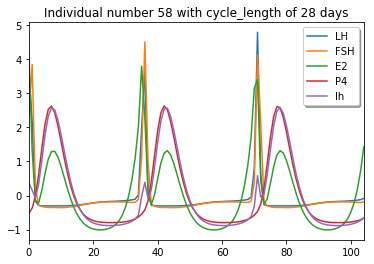

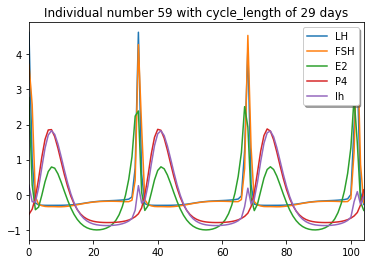

In [12]:
# Visualize data after alignment AND scaling
visualize_data(y_data)

In [13]:
# Execution with number of selected points
nb_peaks_selected = 2     # select the 2 first peaks of the first hormone
# And number of points selected for training
nb_selected_points = 10

### Random sampling

In [14]:
# Select a set of training points
train_sampling_type='random_sampling_nb_selected_points_{}_nb_peaks_selected_{}'.format(nb_selected_points, nb_peaks_selected)
subset_of_points=select_subset_of_points(y_data[:,:nb_train_time_steps], nb_selected_points, nb_peaks_selected, sample_list=None)

# 1 ] MGP

#### A Multitask Gaussian Process is trained on the irregularly sampled data.

In [15]:
# Blockwise MGP
block_indices = [[0,1],[2,3,4]]  #Indices of the tasks for each MGP, each sublist is a block in the total covariance matrix
assert(np.concatenate(block_indices).shape[0] == nb_input_tasks)
nb_blocks = len(block_indices)

## 1.1 Prepare the data for the training

In [16]:
# Train, test split in time!
train_x, train_y, test_x, test_y, _ = prepare_data_before_GP(y_data,
                                                             block_indices = block_indices,
                                                             nb_time_steps = nb_time_steps,
                                                             nb_train_time_steps = nb_train_time_steps,
                                                             nb_train_individuals = nb_individuals_train,
                                                             scaler=None)  # Data is already scaled

## 1.2  Train the MGP

### Hyperparameters

Specify the parameters for the training of the MGP, 'n_iter' represents the maximal number of iterations for the Adam Optimizer that backpropagates the error

In [18]:
# Parameters for training the MGP
mgp_n_iter = 50#500               # max of iterations for the training of the MGP
mgp_learning_rate = 0.015  # learning rate for the trainig of the MGP


This is the time kernel, see gpytorch.kernels to see all the possible kernels, here we aslo set a prior for the period_length parameter : see gpytorch.priors for more info 

In [19]:
mgp_time_kernel = gpytorch.kernels.PeriodicKernel(period_length_prior = gpytorch.priors.NormalPrior(0.31,0.1))

#### Now let's train the multiple MGPs (one for each individual)

### Precisions:
#### Inputs
- **nb_selected_points** : number of points that are used for the training of the MGP. They are selected randomly BUT (see next line)
- **nb_peaks_selected** :  you can specify how many samples from the peaks you want to have in you subselection of points, the peaks are selected from the first task of the first block. if this value is different from 0, the time steps that correspond to the peaks are necessarly choosen. If nb_peaks_selected = 0, the time selection is totaly random.
- **activate_plot** : plot the covariances matrix per bloc, the loss per block and the regressions curves for each individual (each MGP)
- **smart_end** : stops the training when the loss starts increasing too much --> avoid classic behaviors of MGP that start to have a very noisy loss when they start to overfit
- **nb_peaks_selected** : Number of hormonal peaks that will be forced to be included in the training of the MGP

#### Output
 - **h5_dataset_path** is the path of the h5_file that contains all the output means and coavariances matrix per bloc of each individual.
 - **y_predicted** MGP predictive mean for each individual.

In [20]:
# Train MGP-s per individual, learned model is saved as an h5 file in directory outputGP
h5_dataset_path, y_predicted = train_Block_MGP_multiple_individuals(train_x, train_y,
                                                                    test_x, test_y,
                                                                    block_indices,
                                                                    kernel=mgp_time_kernel,
                                                                    learning_rate=mgp_learning_rate,
                                                                    n_iter=mgp_n_iter,
                                                                    train_sample_subset = subset_of_points,
                                                                    main_dir=main_dir,
                                                                    exec_type=exec_type,
                                                                    train_sampling_type=train_sampling_type,
                                                                    activate_plot=False,
                                                                    smart_end=True)

###########      INDIVIDUAL 0    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 38.937
Iter 6/50 - Loss: 37.540
Iter 11/50 - Loss: 36.333
Iter 16/50 - Loss: 35.310
Iter 21/50 - Loss: 34.402
Iter 26/50 - Loss: 33.628
Iter 31/50 - Loss: 32.956
Iter 36/50 - Loss: 32.375
Iter 41/50 - Loss: 31.873
Iter 46/50 - Loss: 31.434
### BLOCK 1 ###
Iter 1/50 - Loss: 17.142
Iter 6/50 - Loss: 16.458
Iter 11/50 - Loss: 15.840
Iter 16/50 - Loss: 15.296
Iter 21/50 - Loss: 14.809
Iter 26/50 - Loss: 14.357
Iter 31/50 - Loss: 13.951
Iter 36/50 - Loss: 13.605
Iter 41/50 - Loss: 13.290
Iter 46/50 - Loss: 13.015
###########      INDIVIDUAL 1    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 38.372
Iter 6/50 - Loss: 36.809
Iter 11/50 - Loss: 35.304
Iter 16/50 - Loss: 33.865
Iter 21/50 - Loss: 32.495
Iter 26/50 - Loss: 31.233
Iter 31/50 - Loss: 30.072
Iter 36/50 - Loss: 29.029
Iter 41/50 - Loss: 28.099
Iter 46/50 - Loss: 27.281
### BLOCK 1 ###
Iter 1/50 - Loss: 16.536
Iter 6/50 - Loss: 16.238
Iter 11/50 - Loss: 16.

Iter 16/50 - Loss: 11.978
Iter 21/50 - Loss: 11.687
Iter 26/50 - Loss: 11.392
Iter 31/50 - Loss: 11.099
Iter 36/50 - Loss: 10.804
Iter 41/50 - Loss: 10.509
Iter 46/50 - Loss: 10.216
### BLOCK 1 ###
Iter 1/50 - Loss: 14.097
Iter 6/50 - Loss: 13.860
Iter 11/50 - Loss: 13.620
Iter 16/50 - Loss: 13.381
Iter 21/50 - Loss: 13.140
Iter 26/50 - Loss: 12.896
Iter 31/50 - Loss: 12.648
Iter 36/50 - Loss: 12.397
Iter 41/50 - Loss: 12.146
Iter 46/50 - Loss: 11.898
###########      INDIVIDUAL 15    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 22.901
Iter 6/50 - Loss: 22.083
Iter 11/50 - Loss: 21.344
Iter 16/50 - Loss: 20.711
Iter 21/50 - Loss: 20.166
Iter 26/50 - Loss: 19.687
Iter 31/50 - Loss: 19.254
Iter 36/50 - Loss: 18.853
Iter 41/50 - Loss: 18.476
Iter 46/50 - Loss: 18.118
### BLOCK 1 ###
Iter 1/50 - Loss: 14.503
Iter 6/50 - Loss: 14.236
Iter 11/50 - Loss: 13.989
Iter 16/50 - Loss: 13.742
Iter 21/50 - Loss: 13.503
Iter 26/50 - Loss: 13.270
Iter 31/50 - Loss: 13.042
Iter 36/50 - Loss: 12.820
It

Iter 21/50 - Loss: 13.499
Iter 26/50 - Loss: 13.189
Iter 31/50 - Loss: 12.864
Iter 36/50 - Loss: 12.552
Iter 41/50 - Loss: 12.223
Iter 46/50 - Loss: 11.896
### BLOCK 1 ###
Iter 1/50 - Loss: 13.369
Iter 6/50 - Loss: 13.081
Iter 11/50 - Loss: 12.812
Iter 16/50 - Loss: 12.543
Iter 21/50 - Loss: 12.276
Iter 26/50 - Loss: 12.014
Iter 31/50 - Loss: 11.757
Iter 36/50 - Loss: 11.502
Iter 41/50 - Loss: 11.250
Iter 46/50 - Loss: 11.001
###########      INDIVIDUAL 29    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 30.434
Iter 6/50 - Loss: 29.342
Iter 11/50 - Loss: 28.479
Iter 16/50 - Loss: 27.715
Iter 21/50 - Loss: 27.037
Iter 26/50 - Loss: 26.431
Iter 31/50 - Loss: 25.888
Iter 36/50 - Loss: 25.398
Iter 41/50 - Loss: 24.949
Iter 46/50 - Loss: 24.533
### BLOCK 1 ###
Iter 1/50 - Loss: 15.020
Iter 6/50 - Loss: 14.825
Iter 11/50 - Loss: 14.631
Iter 16/50 - Loss: 14.444
Iter 21/50 - Loss: 14.264
Iter 26/50 - Loss: 14.091
Iter 31/50 - Loss: 13.921
Iter 36/50 - Loss: 13.755
Iter 41/50 - Loss: 13.592
It

Iter 41/50 - Loss: 13.968
Iter 46/50 - Loss: 13.689
### BLOCK 1 ###
Iter 1/50 - Loss: 15.577
Iter 6/50 - Loss: 15.246
Iter 11/50 - Loss: 14.938
Iter 16/50 - Loss: 14.637
Iter 21/50 - Loss: 14.338
Iter 26/50 - Loss: 14.040
Iter 31/50 - Loss: 13.748
Iter 36/50 - Loss: 13.465
Iter 41/50 - Loss: 13.192
Iter 46/50 - Loss: 12.931
###########      INDIVIDUAL 43    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 37.235
Iter 6/50 - Loss: 34.816
Iter 11/50 - Loss: 30.729
Iter 16/50 - Loss: 29.998
Iter 21/50 - Loss: 28.949
Iter 26/50 - Loss: 27.520
Iter 31/50 - Loss: 26.819
Iter 36/50 - Loss: 25.894
Iter 41/50 - Loss: 25.294
Iter 46/50 - Loss: 24.603
### BLOCK 1 ###
Iter 1/50 - Loss: 14.520
Iter 6/50 - Loss: 14.243
Iter 11/50 - Loss: 13.974
Iter 16/50 - Loss: 13.714
Iter 21/50 - Loss: 13.468
Iter 26/50 - Loss: 13.239
Iter 31/50 - Loss: 13.027
Iter 36/50 - Loss: 12.830
Iter 41/50 - Loss: 12.645
Iter 46/50 - Loss: 12.466
###########      INDIVIDUAL 44    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 

### BLOCK 1 ###
Iter 1/50 - Loss: 14.618
Iter 6/50 - Loss: 14.353
Iter 11/50 - Loss: 14.086
Iter 16/50 - Loss: 13.819
Iter 21/50 - Loss: 13.550
Iter 26/50 - Loss: 13.277
Iter 31/50 - Loss: 13.001
Iter 36/50 - Loss: 12.723
Iter 41/50 - Loss: 12.447
Iter 46/50 - Loss: 12.182
###########      INDIVIDUAL 57    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 21.390
Iter 6/50 - Loss: 20.694
Iter 11/50 - Loss: 17.636
Iter 16/50 - Loss: 17.885
Iter 21/50 - Loss: 17.739
Iter 26/50 - Loss: 17.214
Iter 31/50 - Loss: 16.939
Iter 36/50 - Loss: 16.838
Iter 41/50 - Loss: 16.568
Iter 46/50 - Loss: 16.434
### BLOCK 1 ###
Iter 1/50 - Loss: 15.094
Iter 6/50 - Loss: 14.706
Iter 11/50 - Loss: 14.469
Iter 16/50 - Loss: 14.215
Iter 21/50 - Loss: 13.989
Iter 26/50 - Loss: 13.759
Iter 31/50 - Loss: 13.539
Iter 36/50 - Loss: 13.325
Iter 41/50 - Loss: 13.115
Iter 46/50 - Loss: 12.918
###########      INDIVIDUAL 58    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 18.459
Iter 6/50 - Loss: 17.586
Iter 11/50 - Loss: 1

In [21]:
# Evaluate losses
mgp_y_mse=(test_y.numpy()-y_predicted)**2        
print('MGP with block indices {} and random sampling with {} points selected for training, TEST LOSS={}'.format(block_indices, nb_selected_points, mgp_y_mse[nb_individuals_train + nb_individuals_val:].mean()))

MGP with block indices [[0, 1], [2, 3, 4]] and random sampling with 10 points selected for training, TEST LOSS=0.7829293874506967


### Visualize reconstruction and prediction

TRAIN individual number 0, true cycle_length 32 days, predicted cycle_length 21 days


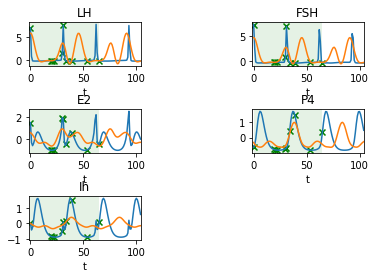

TRAIN individual number 1, true cycle_length 30 days, predicted cycle_length 25 days


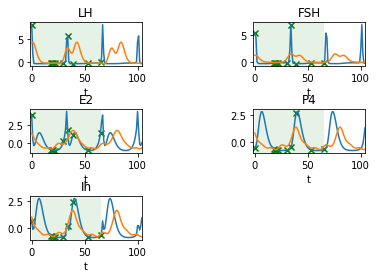

TRAIN individual number 2, true cycle_length 32 days, predicted cycle_length 24 days


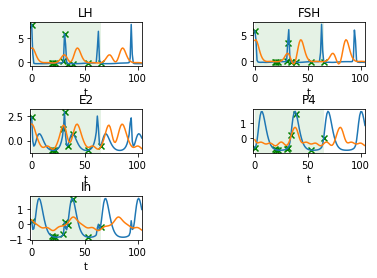

TRAIN individual number 3, true cycle_length 29 days, predicted cycle_length 29 days


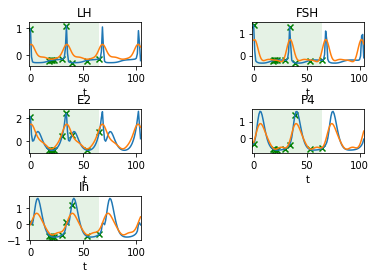

TRAIN individual number 4, true cycle_length 30 days, predicted cycle_length 29 days


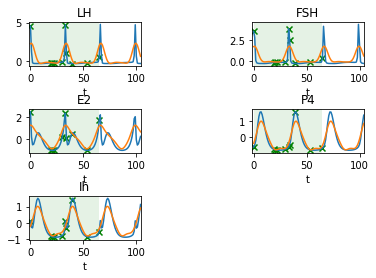

TRAIN individual number 5, true cycle_length 30 days, predicted cycle_length 30 days


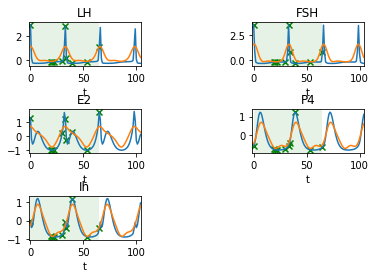

TRAIN individual number 6, true cycle_length 28 days, predicted cycle_length 28 days


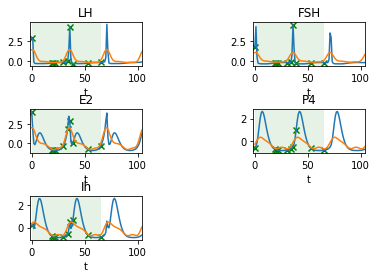

TRAIN individual number 7, true cycle_length 29 days, predicted cycle_length 28 days


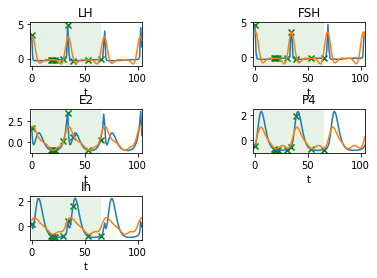

TRAIN individual number 8, true cycle_length 31 days, predicted cycle_length 31 days


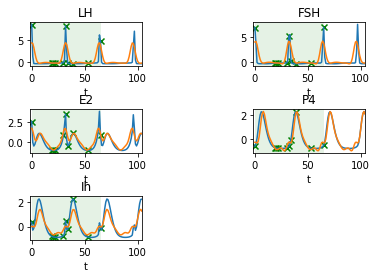

TRAIN individual number 9, true cycle_length 28 days, predicted cycle_length 28 days


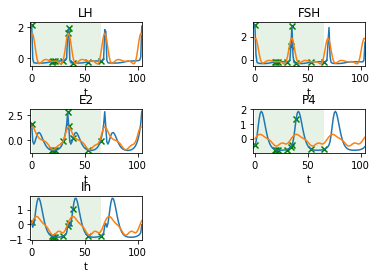

TRAIN individual number 10, true cycle_length 30 days, predicted cycle_length 29 days


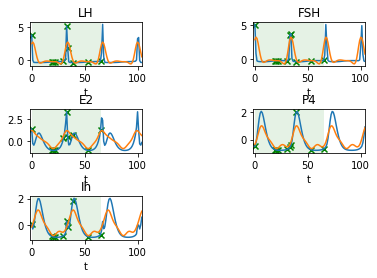

TRAIN individual number 11, true cycle_length 29 days, predicted cycle_length 29 days


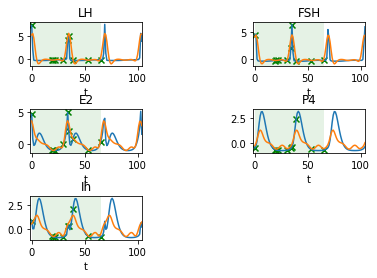

TRAIN individual number 12, true cycle_length 27 days, predicted cycle_length 28 days


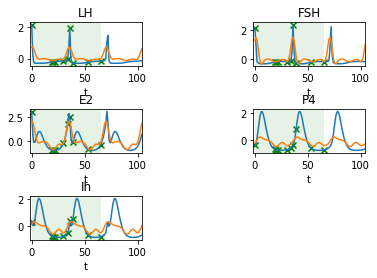

TRAIN individual number 13, true cycle_length 27 days, predicted cycle_length 28 days


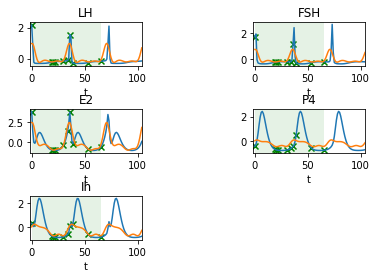

TRAIN individual number 14, true cycle_length 28 days, predicted cycle_length 28 days


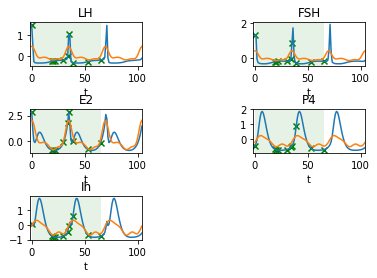

TRAIN individual number 15, true cycle_length 29 days, predicted cycle_length 29 days


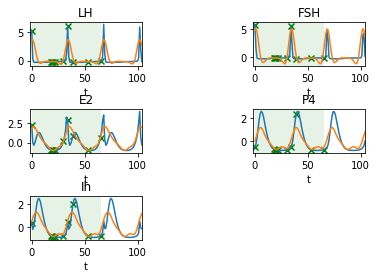

TRAIN individual number 16, true cycle_length 31 days, predicted cycle_length 31 days


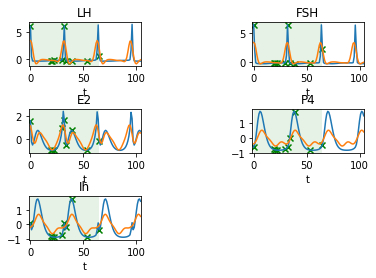

TRAIN individual number 17, true cycle_length 29 days, predicted cycle_length 28 days


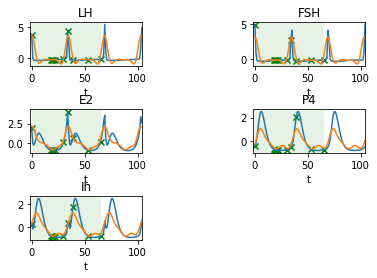

TRAIN individual number 18, true cycle_length 31 days, predicted cycle_length 30 days


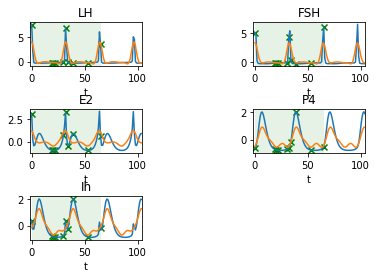

TRAIN individual number 19, true cycle_length 29 days, predicted cycle_length 28 days


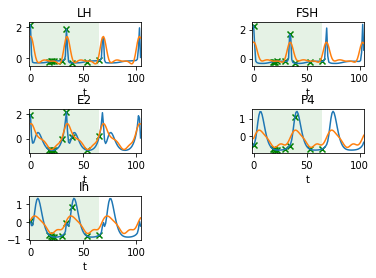

TRAIN individual number 20, true cycle_length 29 days, predicted cycle_length 29 days


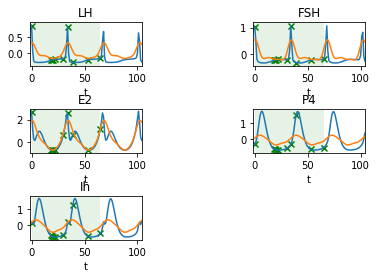

TRAIN individual number 21, true cycle_length 27 days, predicted cycle_length 28 days


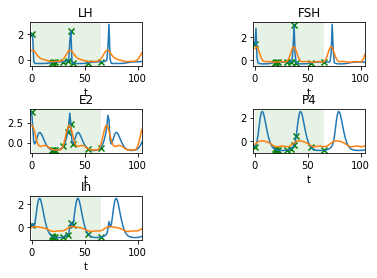

TRAIN individual number 22, true cycle_length 28 days, predicted cycle_length 29 days


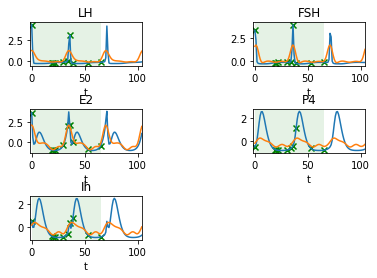

TRAIN individual number 23, true cycle_length 27 days, predicted cycle_length 28 days


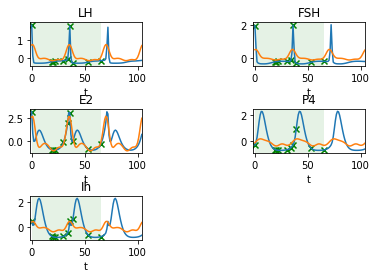

TRAIN individual number 24, true cycle_length 29 days, predicted cycle_length 28 days


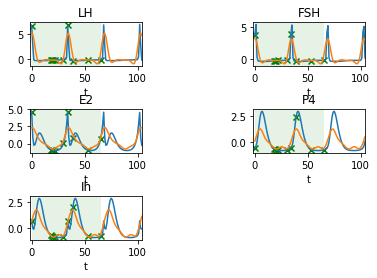

TRAIN individual number 25, true cycle_length 31 days, predicted cycle_length 31 days


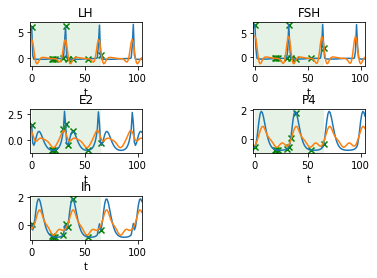

TRAIN individual number 26, true cycle_length 27 days, predicted cycle_length 28 days


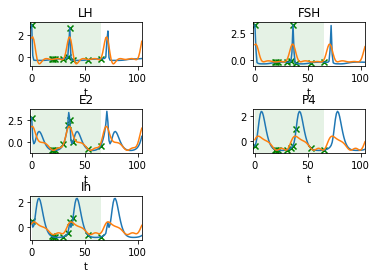

TRAIN individual number 27, true cycle_length 27 days, predicted cycle_length 28 days


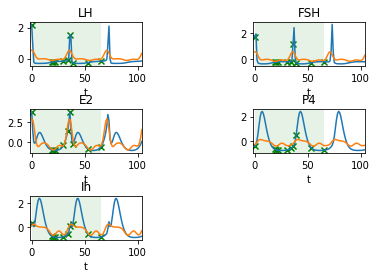

TRAIN individual number 28, true cycle_length 31 days, predicted cycle_length 29 days


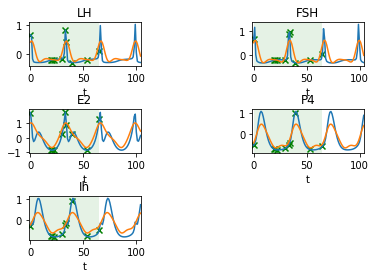

TRAIN individual number 29, true cycle_length 31 days, predicted cycle_length 30 days


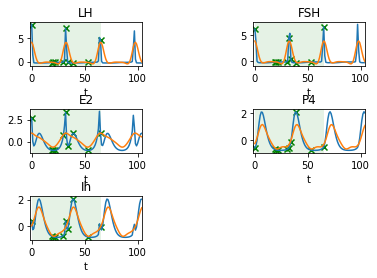

TRAIN individual number 30, true cycle_length 30 days, predicted cycle_length 29 days


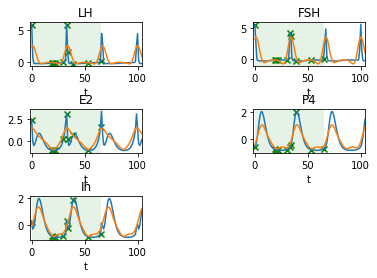

TRAIN individual number 31, true cycle_length 27 days, predicted cycle_length 28 days


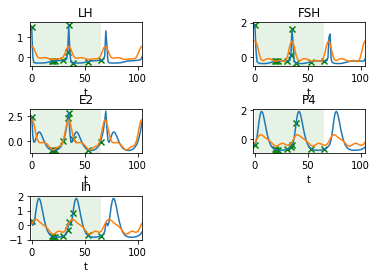

TRAIN individual number 32, true cycle_length 27 days, predicted cycle_length 28 days


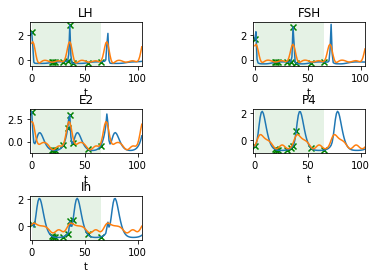

TRAIN individual number 33, true cycle_length 31 days, predicted cycle_length 31 days


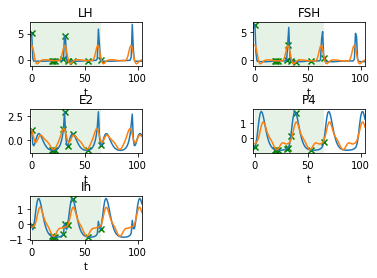

TRAIN individual number 34, true cycle_length 30 days, predicted cycle_length 30 days


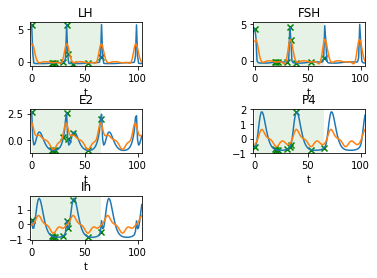

TRAIN individual number 35, true cycle_length 28 days, predicted cycle_length 28 days


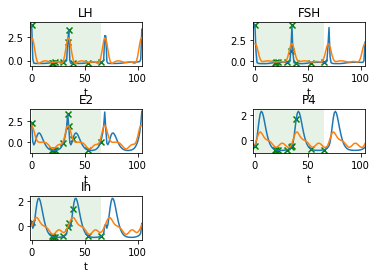

TRAIN individual number 36, true cycle_length 29 days, predicted cycle_length 28 days


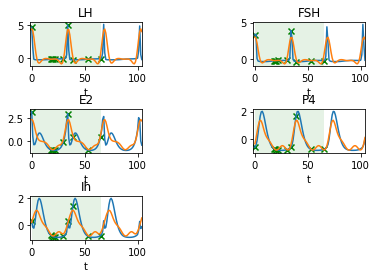

TRAIN individual number 37, true cycle_length 29 days, predicted cycle_length 28 days


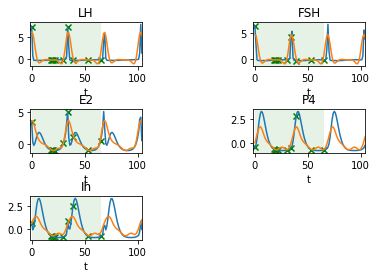

TRAIN individual number 38, true cycle_length 27 days, predicted cycle_length 28 days


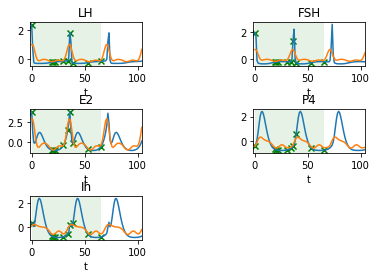

TRAIN individual number 39, true cycle_length 29 days, predicted cycle_length 28 days


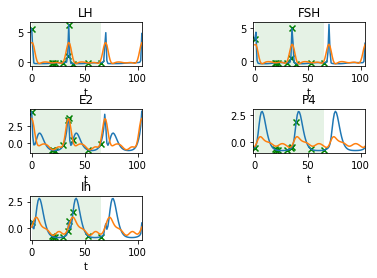

TRAIN validation individual number 40, true cycle_length 29 days, predicted cycle_length 28 days


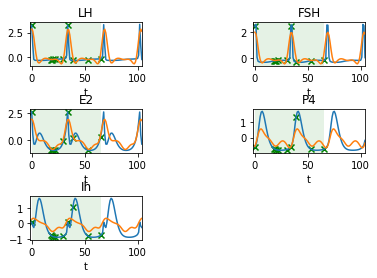

TRAIN validation individual number 41, true cycle_length 31 days, predicted cycle_length 30 days


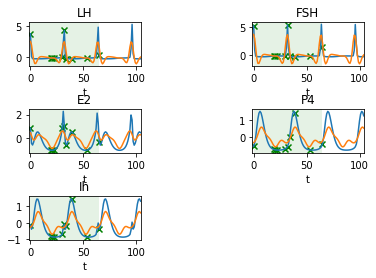

TRAIN validation individual number 42, true cycle_length 27 days, predicted cycle_length 28 days


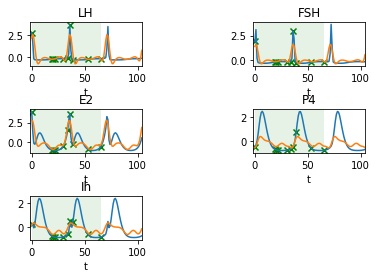

TRAIN validation individual number 43, true cycle_length 32 days, predicted cycle_length 32 days


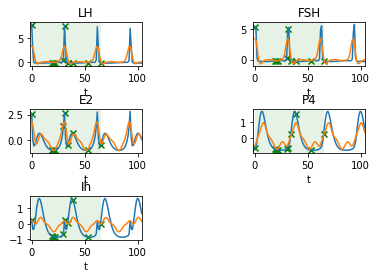

TRAIN validation individual number 44, true cycle_length 27 days, predicted cycle_length 28 days


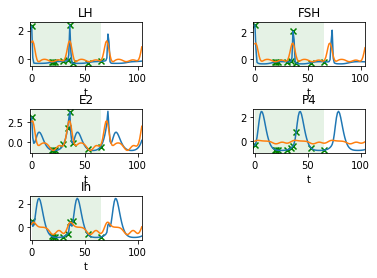

TRAIN validation individual number 45, true cycle_length 27 days, predicted cycle_length 28 days


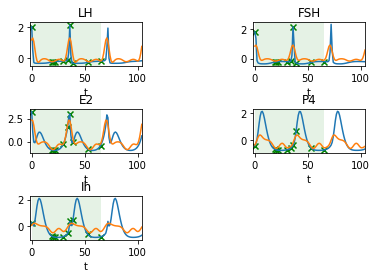

TRAIN validation individual number 46, true cycle_length 30 days, predicted cycle_length 30 days


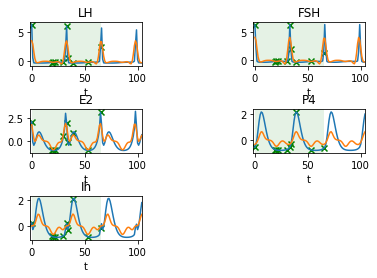

TRAIN validation individual number 47, true cycle_length 29 days, predicted cycle_length 28 days


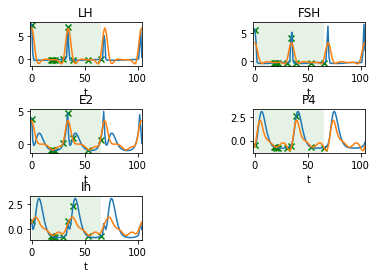

TRAIN validation individual number 48, true cycle_length 30 days, predicted cycle_length 30 days


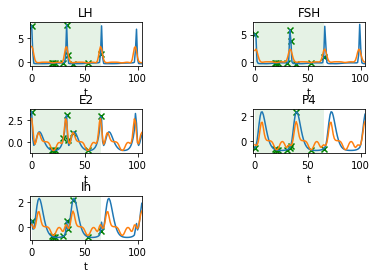

TRAIN validation individual number 49, true cycle_length 29 days, predicted cycle_length 29 days


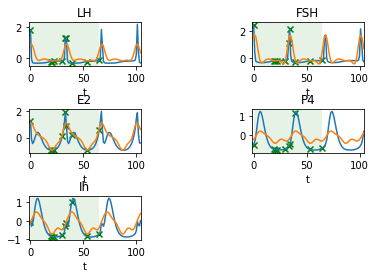

TEST individual number 50, true cycle_length 29 days, predicted cycle_length 28 days


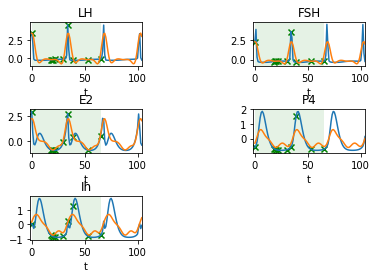

TEST individual number 51, true cycle_length 27 days, predicted cycle_length 28 days


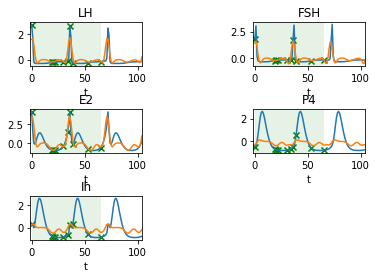

TEST individual number 52, true cycle_length 32 days, predicted cycle_length 27 days


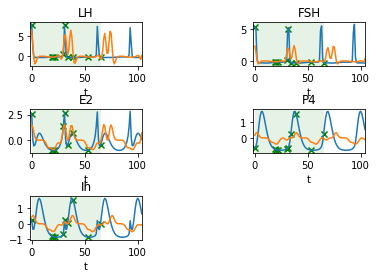

TEST individual number 53, true cycle_length 32 days, predicted cycle_length 28 days


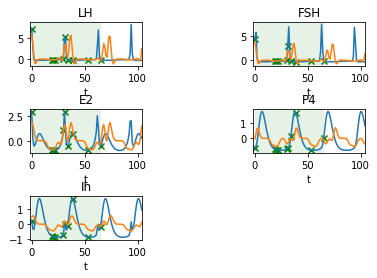

TEST individual number 54, true cycle_length 30 days, predicted cycle_length 30 days


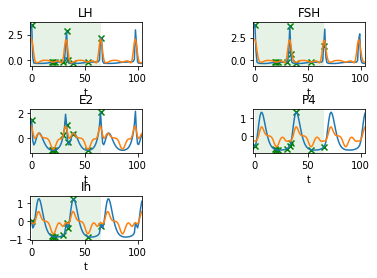

TEST individual number 55, true cycle_length 32 days, predicted cycle_length 32 days


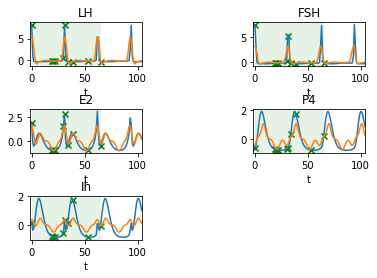

TEST individual number 56, true cycle_length 31 days, predicted cycle_length 31 days


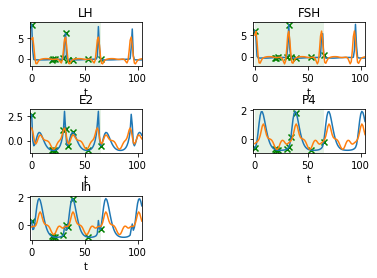

TEST individual number 57, true cycle_length 30 days, predicted cycle_length 29 days


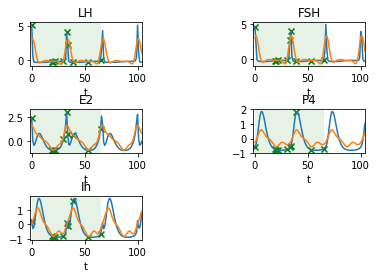

TEST individual number 58, true cycle_length 28 days, predicted cycle_length 28 days


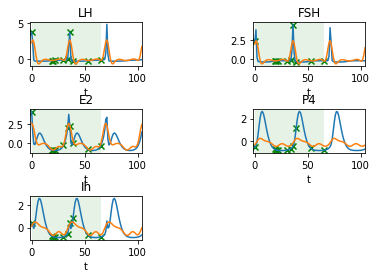

TEST individual number 59, true cycle_length 29 days, predicted cycle_length 28 days


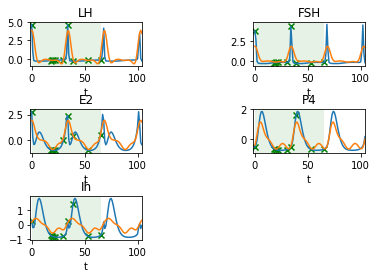

In [22]:
# Default visualization
plot_y_reconstruct_and_predict(y_data, subset_of_points, y_predicted, nb_individuals_train, nb_individuals_val, nb_individuals_test)

['covar_block_0', 'covar_block_1', 'mean_block_0', 'mean_block_1', 'y_predicted']
TRAIN individual number 0


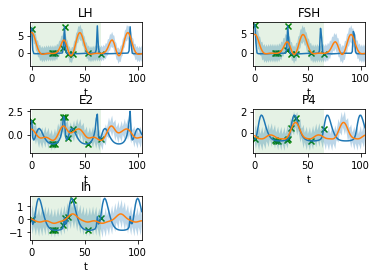

TRAIN individual number 1


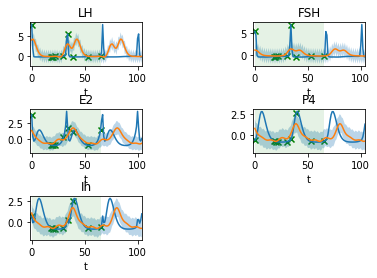

TRAIN individual number 2


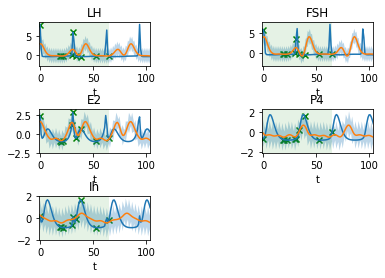

TRAIN individual number 3


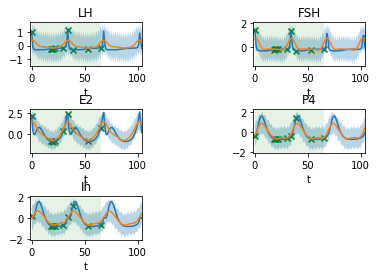

TRAIN individual number 4


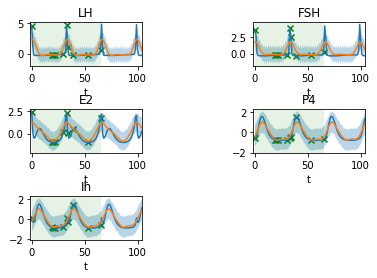

TRAIN individual number 5


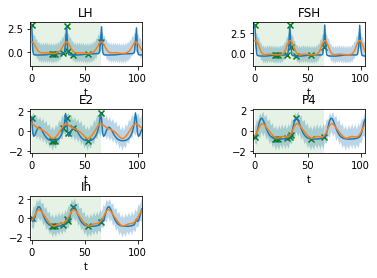

TRAIN individual number 6


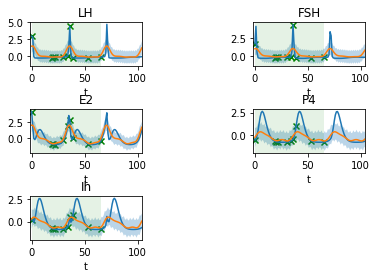

TRAIN individual number 7


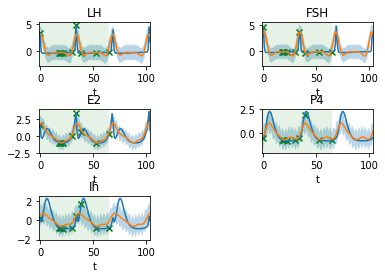

TRAIN individual number 8


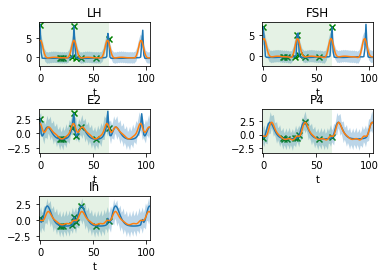

TRAIN individual number 9


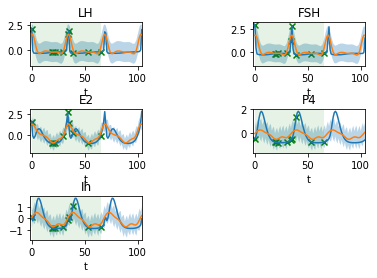

TRAIN individual number 10


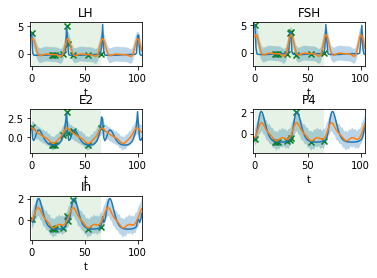

TRAIN individual number 11


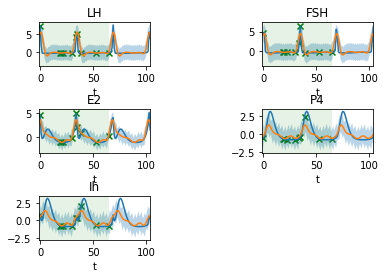

TRAIN individual number 12


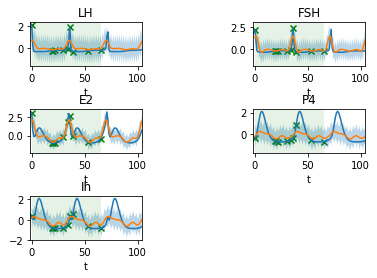

TRAIN individual number 13


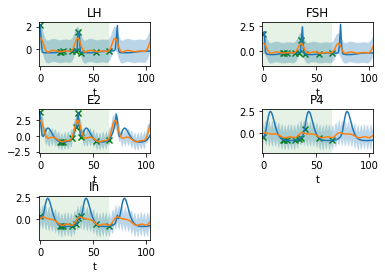

TRAIN individual number 14


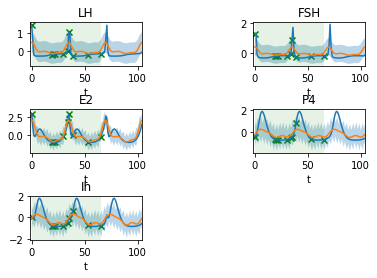

TRAIN individual number 15


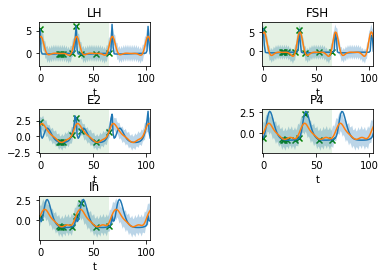

TRAIN individual number 16


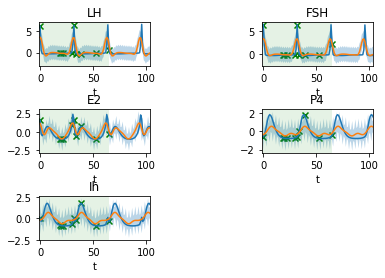

TRAIN individual number 17


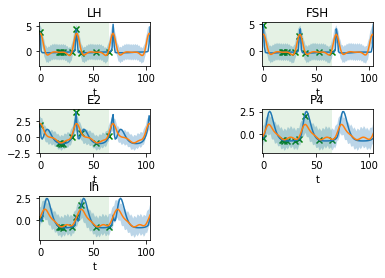

TRAIN individual number 18


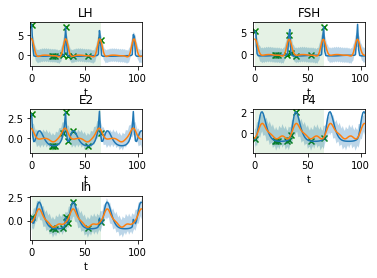

TRAIN individual number 19


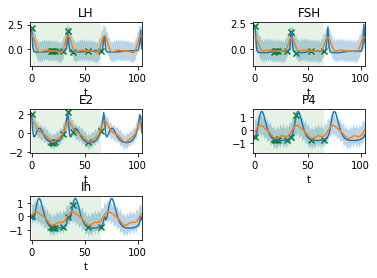

TRAIN individual number 20


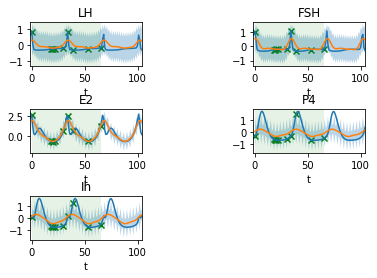

TRAIN individual number 21


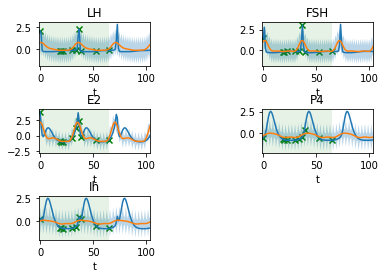

TRAIN individual number 22


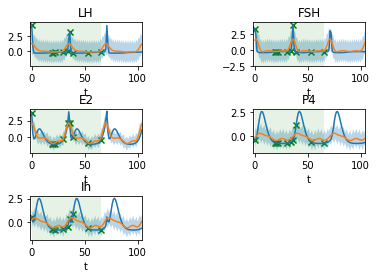

TRAIN individual number 23


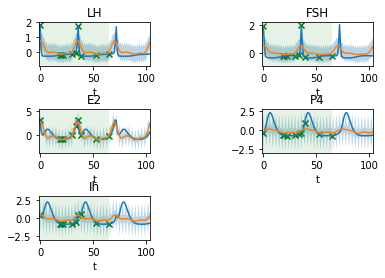

TRAIN individual number 24


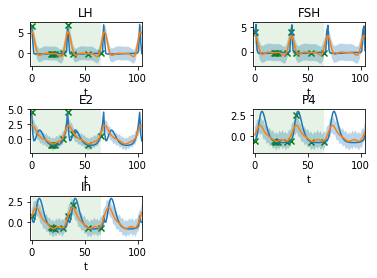

TRAIN individual number 25


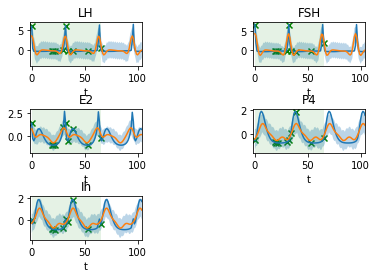

TRAIN individual number 26


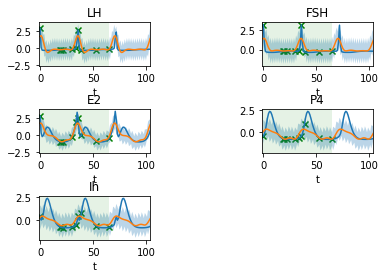

TRAIN individual number 27


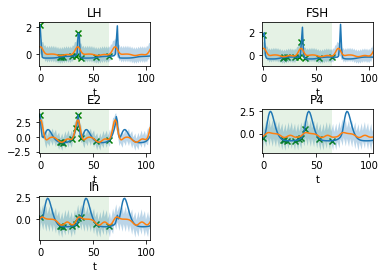

TRAIN individual number 28


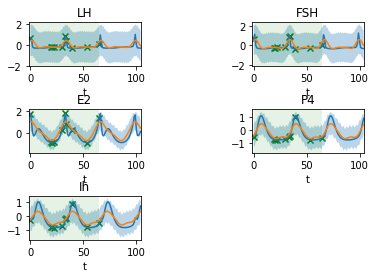

TRAIN individual number 29


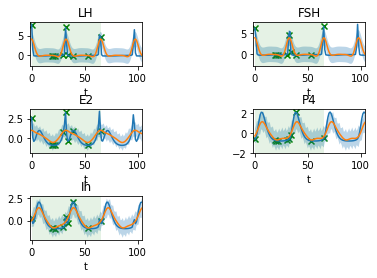

TRAIN individual number 30


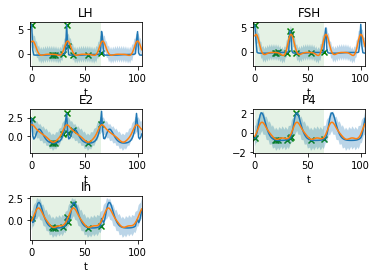

TRAIN individual number 31


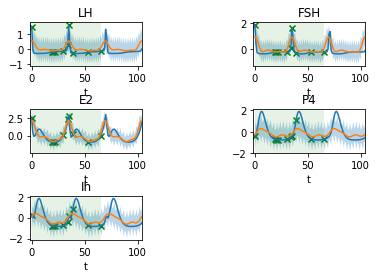

TRAIN individual number 32


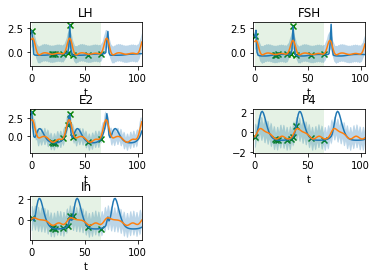

TRAIN individual number 33


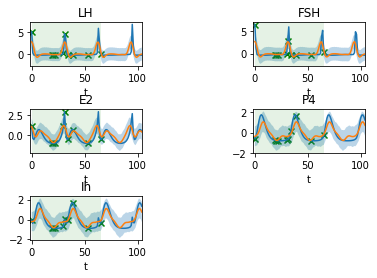

TRAIN individual number 34


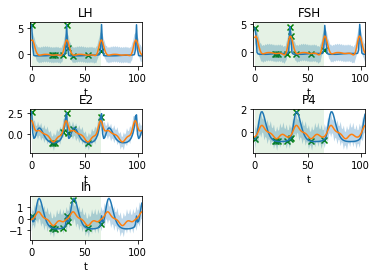

TRAIN individual number 35


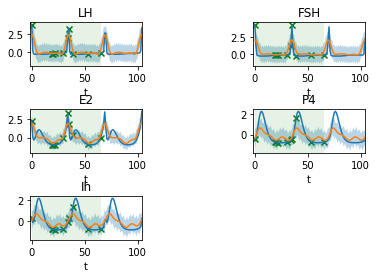

TRAIN individual number 36


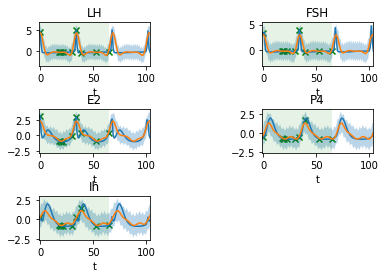

TRAIN individual number 37


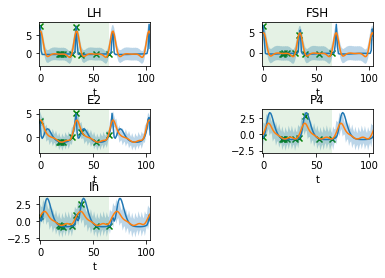

TRAIN individual number 38


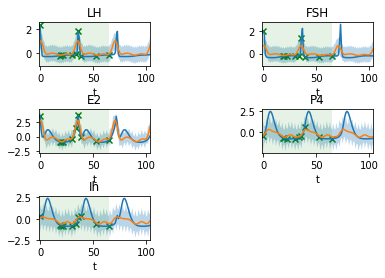

TRAIN individual number 39


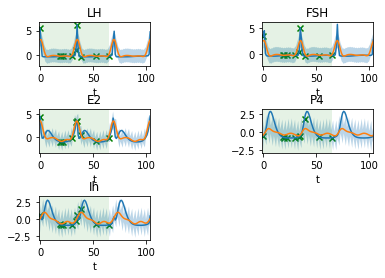

TRAIN validation individual number 40


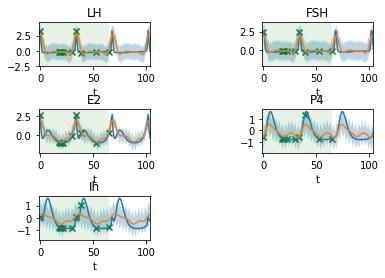

TRAIN validation individual number 41


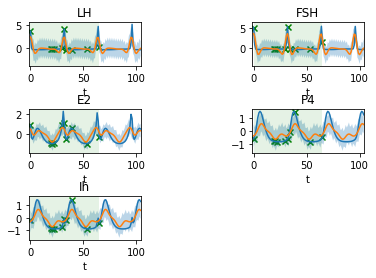

TRAIN validation individual number 42


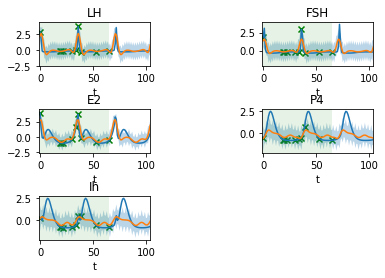

TRAIN validation individual number 43


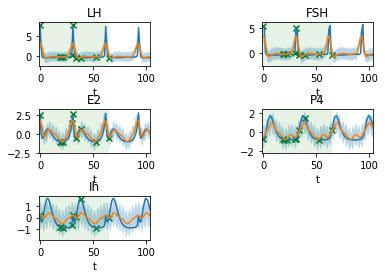

TRAIN validation individual number 44


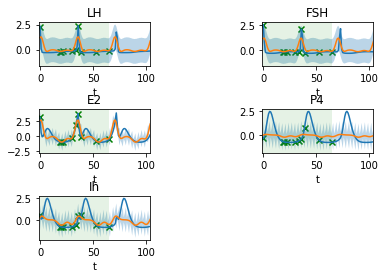

TRAIN validation individual number 45


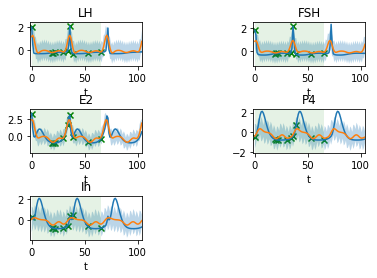

TRAIN validation individual number 46


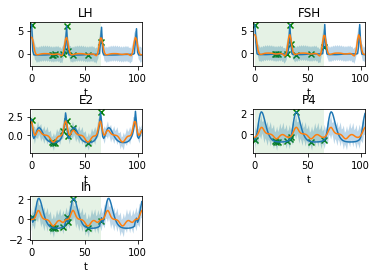

TRAIN validation individual number 47


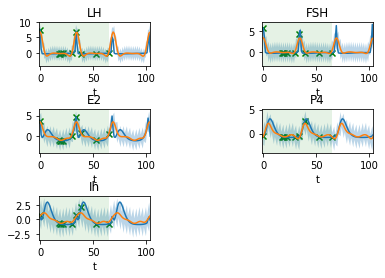

TRAIN validation individual number 48


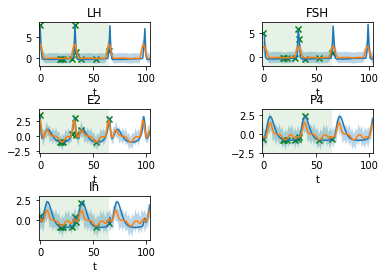

TRAIN validation individual number 49


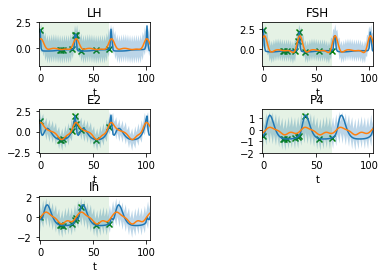

TEST individual number 50


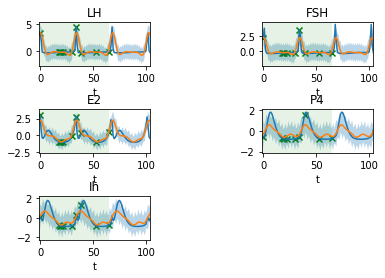

TEST individual number 51


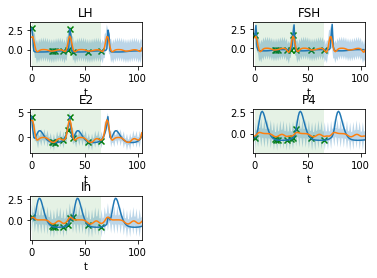

TEST individual number 52


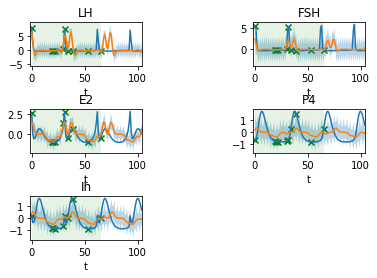

TEST individual number 53


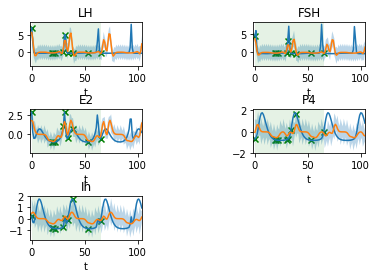

TEST individual number 54


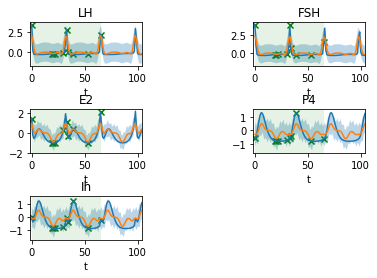

TEST individual number 55


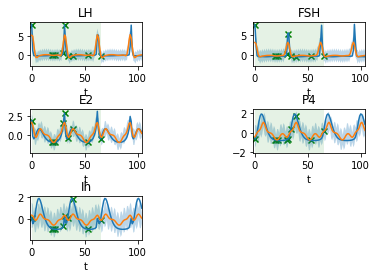

TEST individual number 56


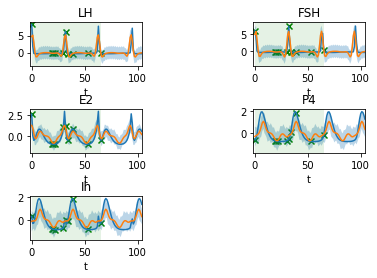

TEST individual number 57


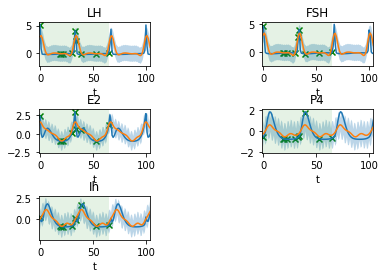

TEST individual number 58


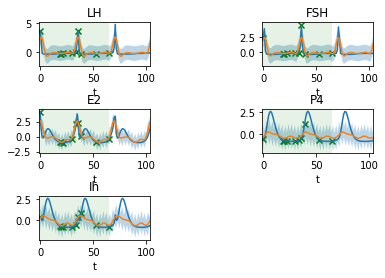

TEST individual number 59


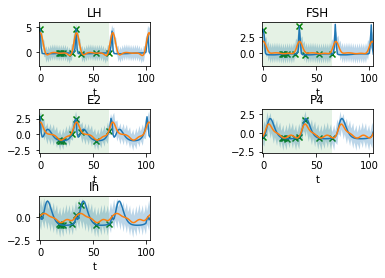

In [23]:
# GP visualization
# Recover GP mean and covariance
y_mean_predicted=np.empty_like(y_data)
y_var_predicted=np.empty_like(y_data)
with h5py.File(h5_dataset_path, 'r') as trained_GPs:
    print(list(trained_GPs.keys()))
    for i in np.arange(len(block_indices)):
        for h_idx,h in enumerate(block_indices[i]):
            y_mean_predicted[:,:,h]=trained_GPs['mean_block_{}'.format(i)][:,:,h_idx]
            y_var_predicted[:,:,h]=np.diagonal(trained_GPs['covar_block_{}'.format(i)][:,nb_time_steps*h_idx:nb_time_steps*(h_idx+1),nb_time_steps*h_idx:nb_time_steps*(h_idx+1)],axis1=1, axis2=2)

# Visualize GP prediction 
plot_y_GP_reconstruct_and_predict(y_data, subset_of_points,y_mean_predicted, y_var_predicted,
                                   nb_individuals_train, nb_individuals_val, nb_individuals_test)

# 2 ] DCNN

## 2.1 Build a learning dataset from the ouput of the MGPs

### And we build our dataset...
#### Inputs :
- **output_gp_path** : the path of the trained MGP output file (created above, which contain the mean and covariance matrices of the Block MGP)
- **y_true** : the full y_data array
- **nb_samples_per_id**  (default=1):
    if = 1 : we just take the mean as input for the DCNN,
    if >1 : we sample 'nb_samples_per_id' posteriors from each individual distribution...
- **plot_some_posteriors** : to see the shapes of some posteriors...

In [24]:
# Get MGP posterior sample streams
x_train, y_train, x_val, y_val, x_test, y_test = import_and_split_data_train_val_test(output_gp_path = h5_dataset_path,
                                                                                        y_true = y_data,
                                                                                        block_indices= block_indices,
                                                                                        nb_timesteps = nb_time_steps,
                                                                                        nb_tasks = nb_input_tasks,
                                                                                        nb_individuals = nb_individuals,
                                                                                        nb_individuals_train = nb_individuals_train,
                                                                                        nb_individuals_val = nb_individuals_val,
                                                                                        nb_individuals_test = nb_individuals_test,
                                                                                        nb_samples_per_id=nb_samples_per_id,
                                                                                        plot_some_posteriors = False)

# Note that the dataset contains nb_samples_per_id consecutive posteriors for each same individual

../../src/MGP_DCNN/data_processing.py:160: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  return np.random.multivariate_normal(gp_out_mean, covar_matrix, num_samples)


## 2.2 Build the Neural Network

First we build our object (Time_Neural_Network class) by specifying parameters that will be fixed for any network :

    - batch_size: number of individuals to use for training
    - nb_epochs: number of epochs to train the model
    
Once again, **those parameters will be fixed for all the networks during the Bayesian Optimization.**

In [25]:
dcnn_batch_size=50
dcnn_nb_epochs=500

In [26]:
# Initialize
network = Time_Neural_Network('CNN', dcnn_batch_size, dcnn_nb_epochs,
                                x_train=x_train, y_train=y_train,
                                x_val=x_val, y_val=y_val,
                                x_test=x_test, y_test=y_test,
                                main_dir=main_dir,
                                exec_type=exec_type,
                                train_sampling_type=train_sampling_type)

**The architecture parameters (learning rate, nb_layers,...) can be manually specified (section 2.3) or automatically learned via Bayesian optimization (section 2.4)**

## 2.3 Train the network, based on manually inputed parameters

In [27]:
# DCNN parameters
dcnn_learning_rate=2e-3
dcnn_nb_hidden_layers=5
dcnn_nb_filters=8
dcnn_regularizer_coef=1e-7
dcnn_kernel_size=6
dcnn_dilation_factor=2

In [28]:
# Build, based on manually inputed parameters
network.build_TNN(learning_rate=dcnn_learning_rate, 
                  nb_hidden_layers=dcnn_nb_hidden_layers, 
                  nb_filters=dcnn_nb_filters,
                  regularizer_coef=dcnn_regularizer_coef, 
                  kernel_size=dcnn_kernel_size, 
                  dilation_factor=dcnn_dilation_factor, 
                  display_summary=False)

## 2.4 Bayesian Optimization
#### Find the best hyperparameters for the neural network using Bayesian Optimization and Expected Improvement

Parameters for the Bayesian optimization, which is done with respect to the **validation loss**
   - **nb_calls** : the number of neural networks we are going to try, for each one the validation loss is computed
   - **nb_random_start** : nb of random calls to the routine

In [33]:
# Bayesian Optimization of DCNN
bo_nb_calls = 6
bo_nb_random_starts = 5
# Set potential parameter ranges
bo_learning_rate = Real(low=0.5e-3, high=2e-2, prior='log-uniform', name='learning_rate')
bo_nb_hidden_layers = Integer(low=3, high=6, name='nb_layers')
bo_nb_filters = Integer(low=5, high=12, name='nb_filters')
bo_regularizer_coef = Real(low=1e-8, high=1e-3, prior='log-uniform', name='regularizer_coef')
bo_kernel_size = Integer(low=2, high=9, name='kernel_size')
bo_dilation_factor = Integer(low=2, high=3, name='kernel_size')
bo_parameters_range = [bo_learning_rate,bo_nb_hidden_layers,bo_nb_filters,bo_regularizer_coef, bo_kernel_size, bo_dilation_factor]
bo_default_parameters = [dcnn_learning_rate, dcnn_nb_hidden_layers, dcnn_nb_filters, dcnn_regularizer_coef, dcnn_kernel_size, dcnn_dilation_factor]

In [44]:
# Train with Bayesian Optimization in validation set
search_result = network.optimization_process(bo_parameters_range,
                             default_parameters=bo_default_parameters,
                             nb_calls = bo_nb_calls,
                             nb_random_starts = bo_nb_random_starts,
                             plot_conv=False)

MGP+TNN: 	 Train loss=0.25055178687964136 (1.518392458741059)
		 Validation loss=0.24827733560551618 (1.447101991757839)
		 Test loss=0.5036762043571011 (2.8334881149480187)
Time 443.64658784866333 Learning_rate  0.002  nb_layers  5  nb_filters  8  kernel_size  6  regularizer_coef  1e-07  dilation_factor  2
MGP+TNN: 	 Train loss=0.30632452616372924 (1.7247643070415872)
		 Validation loss=0.279308836289118 (1.4476450430597179)
		 Test loss=0.522872955621113 (2.812319764110732)
Time 347.6045687198639 Learning_rate  0.019704173342615743  nb_layers  5  nb_filters  7  kernel_size  6  regularizer_coef  1.6445940277218946e-05  dilation_factor  2
MGP+TNN: 	 Train loss=0.387584703037136 (2.014137464374157)
		 Validation loss=0.33742418226138415 (1.5554034427842676)
		 Test loss=0.5998518369366965 (2.8721110042158546)
Time 426.10324358940125 Learning_rate  0.011661867012327866  nb_layers  5  nb_filters  6  kernel_size  3  regularizer_coef  6.588142206597794e-07  dilation_factor  2
MGP+TNN: 	 Tra

In [45]:
# Select best network architecture
index_min_val_loss = np.argmin(search_result.func_vals)
best_network=network.params_history[index_min_val_loss]
# Best predictions
dcnn_predicted=network.y_predicted[index_min_val_loss]
# Evaluate losses
dcnn_y_mse=(np.concatenate((y_train,y_val,y_test),axis=0)-dcnn_predicted)**2
# Since we have nb_samples_per_id
dcnn_y_mse_reshaped=np.reshape(dcnn_y_mse, (nb_samples_per_id,nb_individuals,nb_time_steps,nb_input_tasks), order='F')
# Recompute per individual
dcnn_y_mse=dcnn_y_mse_reshaped.mean(axis=0)
print('MGP+DCNN with block indices {} and random sampling with {} points selected for training, TEST LOSS={}'.format(block_indices, nb_selected_points, dcnn_y_mse[(nb_individuals_train + nb_individuals_val):].mean()))

MGP+DCNN with block indices [[0, 1], [2, 3, 4]] and random sampling with 10 points selected for training, TEST LOSS=0.49914754551123197


### Visualize reconstruction and prediction

In [46]:
# Since we have nb_samples_per_id
dcnn_y_predicted=np.reshape(dcnn_predicted, (nb_samples_per_id,nb_individuals,nb_time_steps,nb_input_tasks), order='F').mean(axis=0)

TRAIN individual number 0


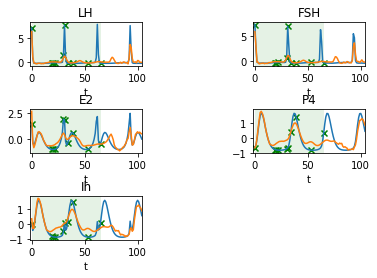

TRAIN individual number 1


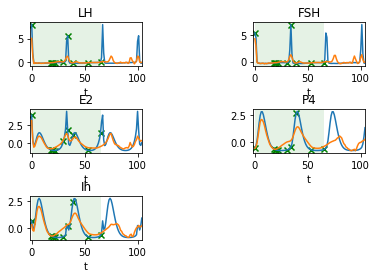

TRAIN individual number 2


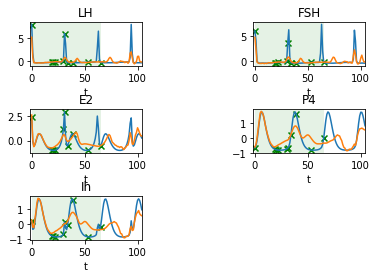

TRAIN individual number 3


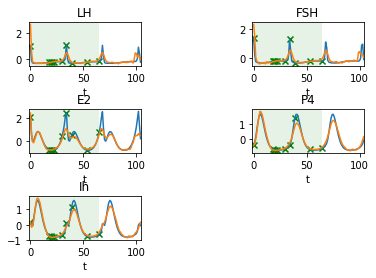

TRAIN individual number 4


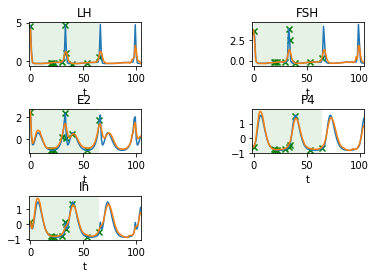

TRAIN individual number 5


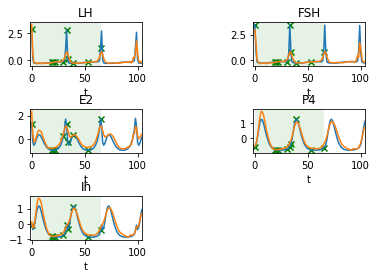

TRAIN individual number 6


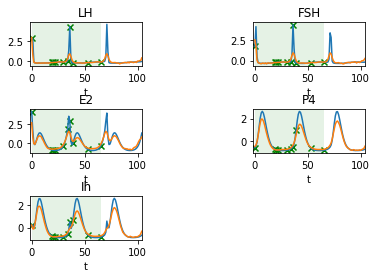

TRAIN individual number 7


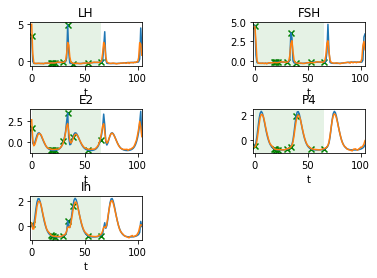

TRAIN individual number 8


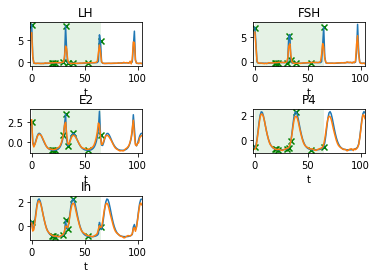

TRAIN individual number 9


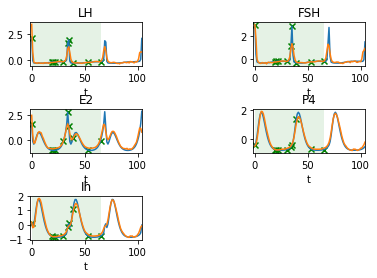

TRAIN individual number 10


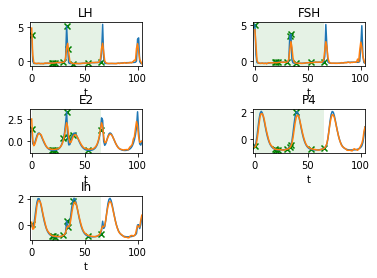

TRAIN individual number 11


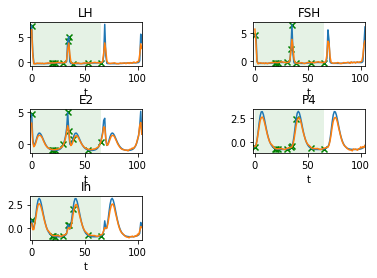

TRAIN individual number 12


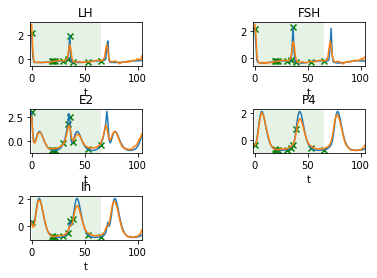

TRAIN individual number 13


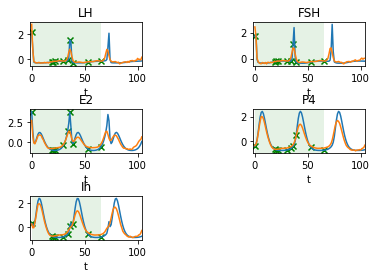

TRAIN individual number 14


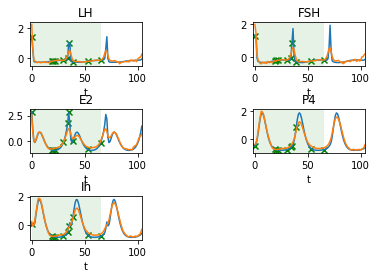

TRAIN individual number 15


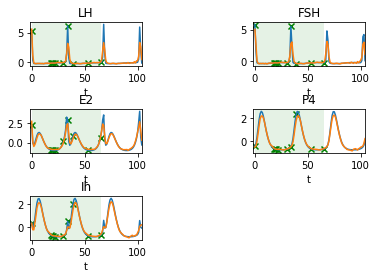

TRAIN individual number 16


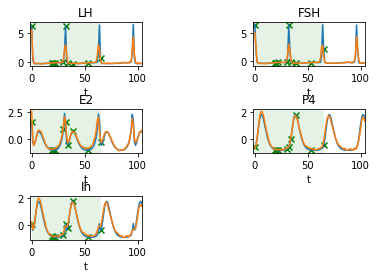

TRAIN individual number 17


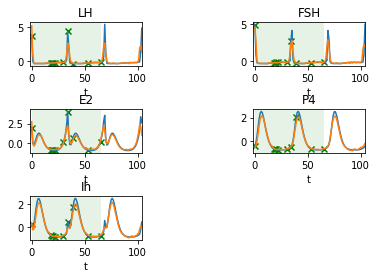

TRAIN individual number 18


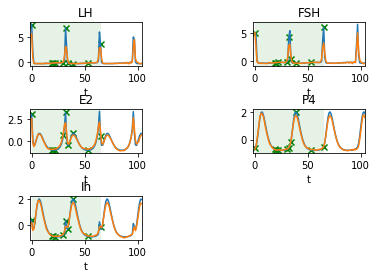

TRAIN individual number 19


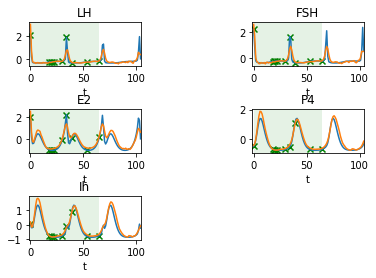

TRAIN individual number 20


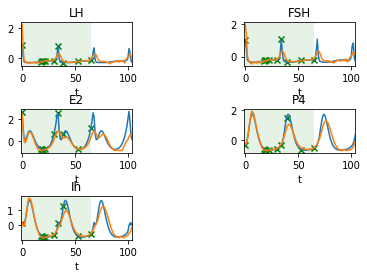

TRAIN individual number 21


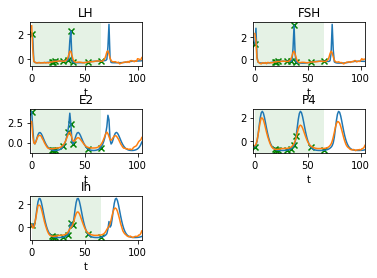

TRAIN individual number 22


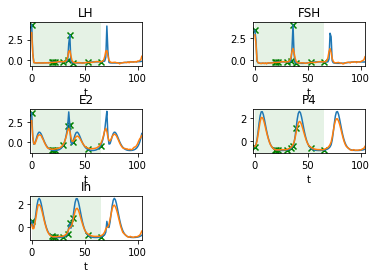

TRAIN individual number 23


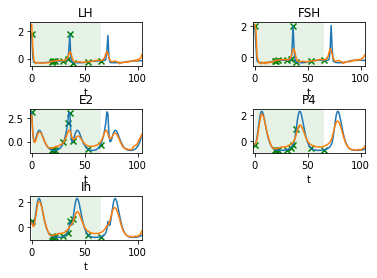

TRAIN individual number 24


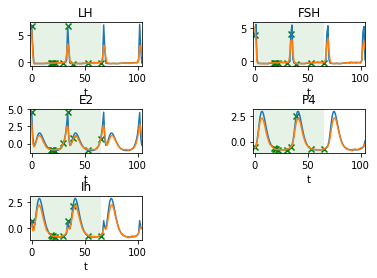

TRAIN individual number 25


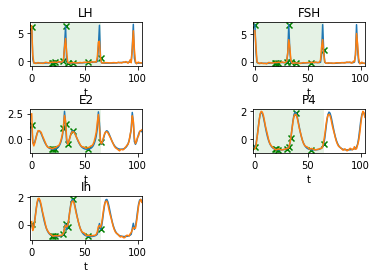

TRAIN individual number 26


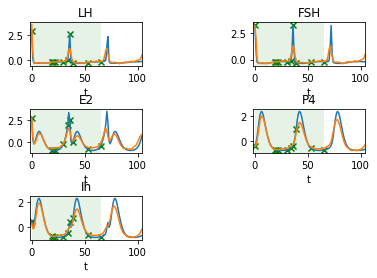

TRAIN individual number 27


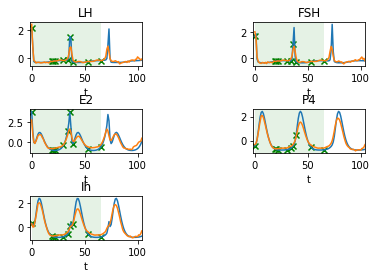

TRAIN individual number 28


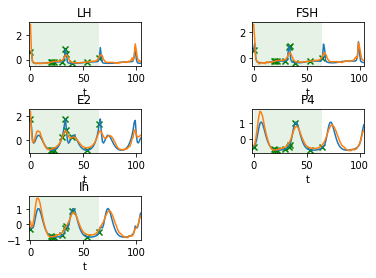

TRAIN individual number 29


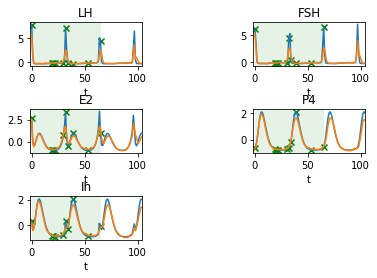

TRAIN individual number 30


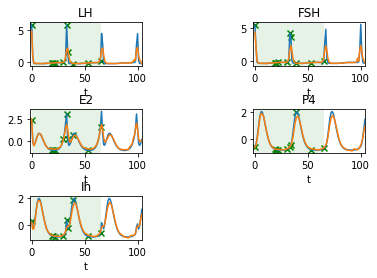

TRAIN individual number 31


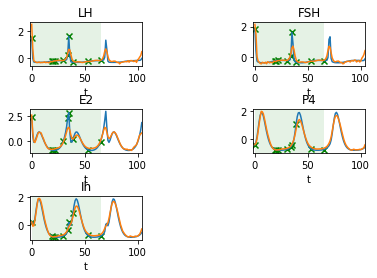

TRAIN individual number 32


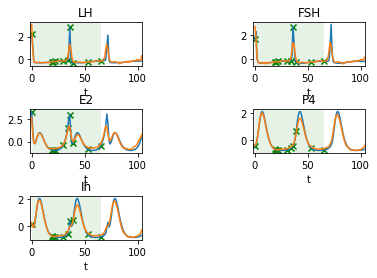

TRAIN individual number 33


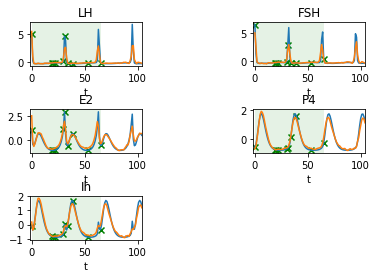

TRAIN individual number 34


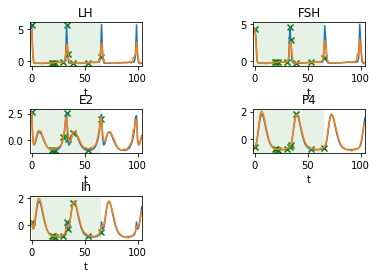

TRAIN individual number 35


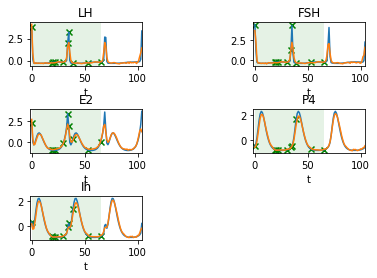

TRAIN individual number 36


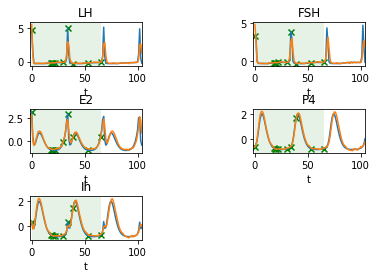

TRAIN individual number 37


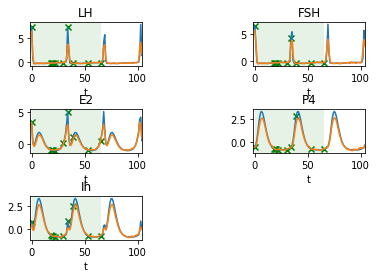

TRAIN individual number 38


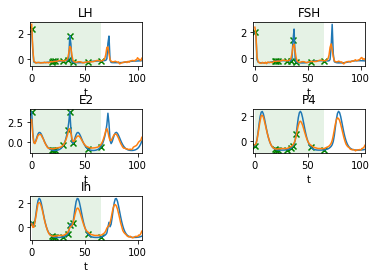

TRAIN individual number 39


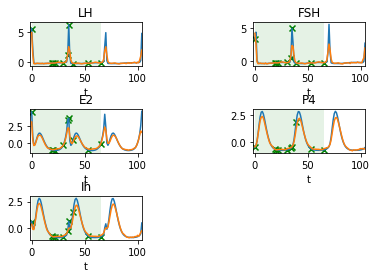

TRAIN validation individual number 40


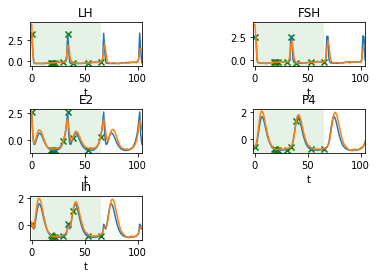

TRAIN validation individual number 41


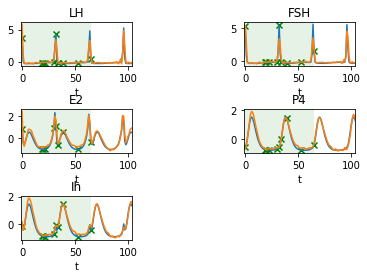

TRAIN validation individual number 42


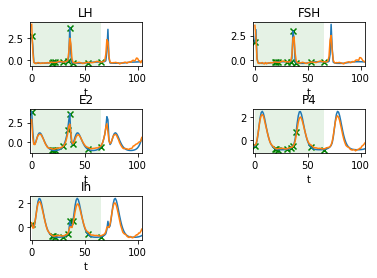

TRAIN validation individual number 43


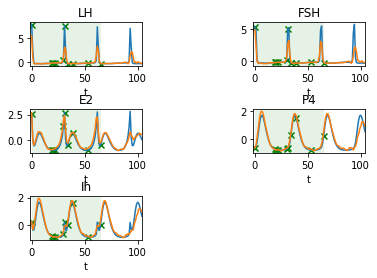

TRAIN validation individual number 44


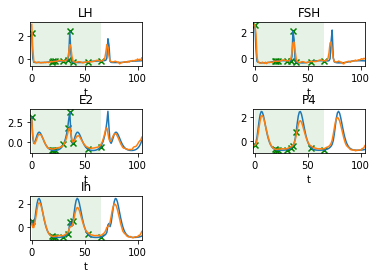

TRAIN validation individual number 45


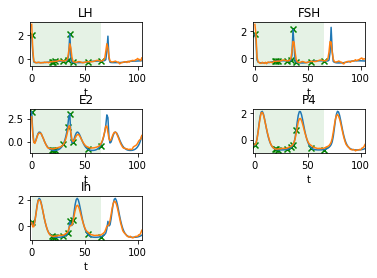

TRAIN validation individual number 46


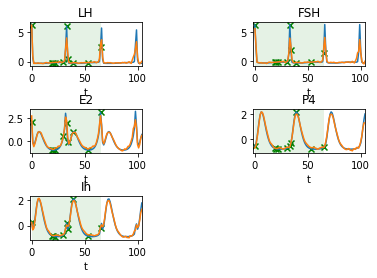

TRAIN validation individual number 47


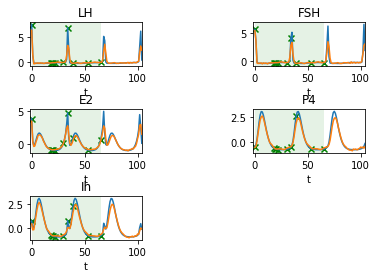

TRAIN validation individual number 48


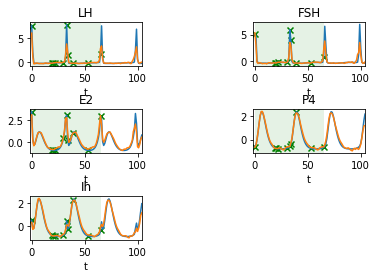

TRAIN validation individual number 49


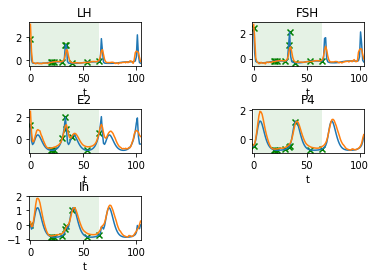

TEST individual number 50


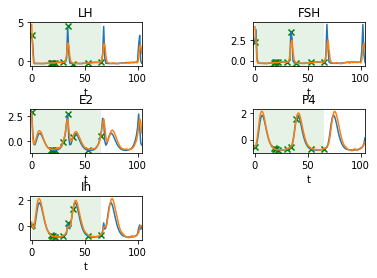

TEST individual number 51


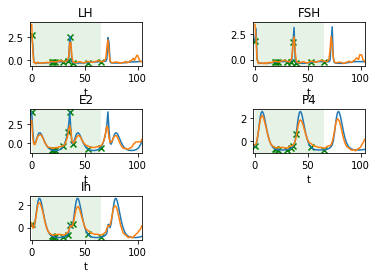

TEST individual number 52


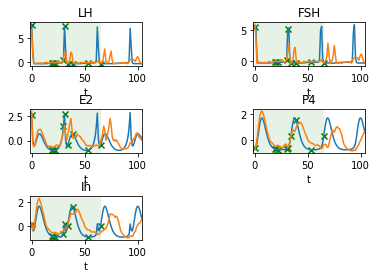

TEST individual number 53


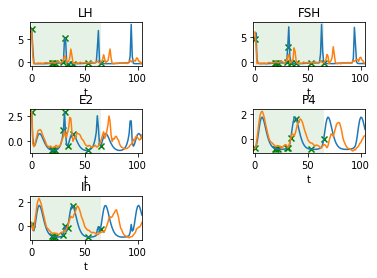

TEST individual number 54


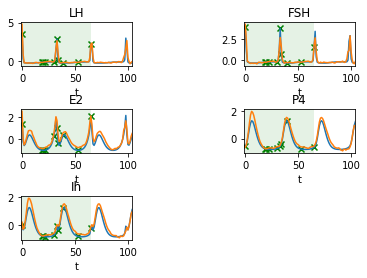

TEST individual number 55


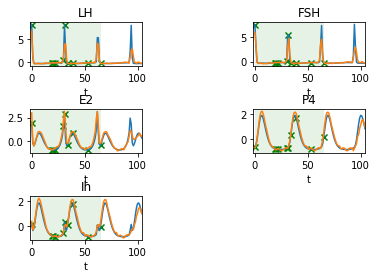

TEST individual number 56


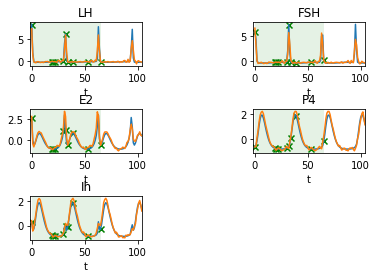

TEST individual number 57


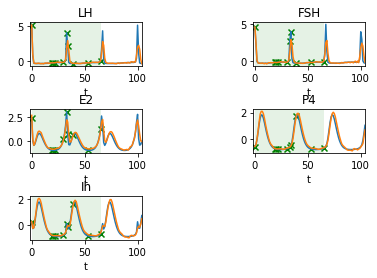

TEST individual number 58


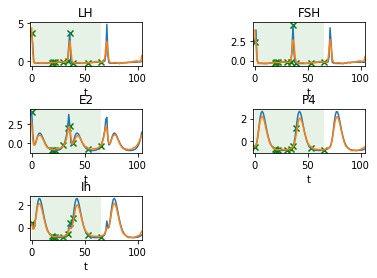

TEST individual number 59


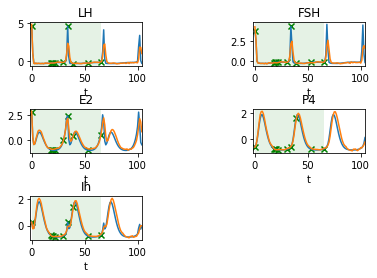

In [51]:
plot_y_reconstruct_and_predict(y_data, subset_of_points, dcnn_y_predicted, nb_individuals_train, nb_individuals_val, nb_individuals_test)